In [19]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [20]:
# !pip install pydrive                             # Package to use Google Drive API - not installed in Colab VM by default
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive

In [21]:
from google.colab import auth                    # Other necessary packages
from oauth2client.client import GoogleCredentials

In [22]:
auth.authenticate_user()                         # Follow prompt in the authorization process
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()

In [23]:
drive = GoogleDrive(gauth)
your_module = drive.CreateFile({"id": "1JuuzR_nwbqpBdiHe5acZFxuaPDWezbOE"})   
your_module.GetContentFile("engine.py")          

In [24]:
drive = GoogleDrive(gauth)
your_module = drive.CreateFile({"id": "1e7MdIQ08l3KjayaeHU3h6qcV0_IEC0mK"})   
your_module.GetContentFile("agent.py")          
import agent

In [25]:
drive = GoogleDrive(gauth)
your_module = drive.CreateFile({"id": "1zY8ScyTTwhkw3uvR0XJBab0uOu0GHuFZ"})   
your_module.GetContentFile("block.txt")          

In [26]:
from engine import DeepPlace
from agent import Agent
import time
import argparse
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pdb

In [27]:
class MyArgs:
  def __init__(self):
    self.width = 5
    self.height = 5
    self.numofgames = 1000
    self.discount = 0.95
    self.save_interval = 100
    self.replay_interval = 10
    self.saved_path = "trained_models"
    self.load_model = 0
    self.view_placement = 0

In [28]:
args = MyArgs()

# Initialize Placement enviroment
env = DeepPlace(args.width, args.height)

# Initialize training variable
max_episode = args.numofgames
max_steps = args.width * args.height * 8 # 8 orientations

agent = Agent(env.state_size, args.numofgames, args.discount)

if(args.load_model):
    agent.load_model(args.saved_path + '/model.h5')

episodes = []
rewards = []

current_max = 0

In [29]:
layer1 = []
layer2 = []
layer3 = []
layer4 = []

In [30]:
for episode in range(max_episode):
    current_state = env.reset()
    done = False
    steps = 0
    total_reward = 0
    env._new_piece()
    print("Running episode " + str(episode))

    while not done and steps < max_steps:   
        # Render the board for visualization
        env.render(total_reward, str(episode) + "_" + str(steps), args.view_placement)

        # Get all possible tetromino placement in current board
        next_states = env.get_next_states()

        # If the dict is empty, meaning game is over
        if not next_states:
            next_state = env.reset()
            done = True
            reward = -1e10
            total_reward += reward
            agent.add_to_memory(current_state, next_state, reward, done)
            break
            
        # Tell agent to choose the best possible state
        best_state = agent.act(next_states.values())

        # Grab best tetromino position and its rotation chosen by the agent
        best_action = None
        for action, state in next_states.items():
            if (best_state==state).all():
                best_action = action
                break

        reward, done = env.step(best_action)
        total_reward += reward

        # Add to memory for replay
        agent.add_to_memory(current_state, next_states[best_action], reward, done)

        # Set current new state 
        current_state = next_states[best_action]

        steps += 1

    print("Total reward: " + str(total_reward))
    episodes.append(episode)
    rewards.append(total_reward)

    if((episode+1)%args.replay_interval==0):
        agent.replay()
        weights = agent.model.get_weights()
        weights = np.array(weights)
        layer1.append(weights[0])
        layer1.append(weights[1])
        layer2.append(weights[2])
        layer2.append(weights[3])
        layer3.append(weights[4])
        layer3.append(weights[5])
        layer4.append(weights[6])
        layer4.append(weights[7])

    if((episode+1)%args.save_interval==0):
        agent.save_model(args.saved_path + '/model.h5')


    if agent.epsilon > agent.epsilon_min:
        agent.epsilon -= agent.epsilon_decay

Running episode 0
Total reward: -10000000000.0
Running episode 1
Total reward: -10000000000.0
Running episode 2
Total reward: -10000000000.0
Running episode 3
Total reward: -10000000000.0
Running episode 4
Total reward: -10000000000.0
Running episode 5
Total reward: -10000000000.0
Running episode 6
Total reward: -10000000000.0
Running episode 7
Total reward: -10000000000.0
Running episode 8
Total reward: -10000000000.0
Running episode 9
Total reward: -10000000000.0
Running episode 10
Total reward: -10000000000.0
Running episode 11
Total reward: -10000000000.0
Running episode 12
Total reward: -10000000000.0
Running episode 13
Total reward: -10000000000.0
Running episode 14
Total reward: -10000000000.0
Running episode 15
Total reward: -10000000000.0
Running episode 16
Total reward: -10000000000.0
Running episode 17
Total reward: -10000000000.0
Running episode 18
Total reward: -10000000000.0
Running episode 19
Total reward: -10000000000.0
Running episode 20
Total reward: -10000000000.0
Ru

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:53: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


Total reward: -10000000000.0
Running episode 49
Total reward: -10000000000.0
Running episode 50
Total reward: -10000000000.0
Running episode 51
Total reward: -10000000000.0
Running episode 52
Total reward: -10000000000.0
Running episode 53
Total reward: -10000000000.0
Running episode 54
Total reward: -10000000000.0
Running episode 55
Total reward: -10000000000.0
Running episode 56
Total reward: -10000000000.0
Running episode 57
Total reward: -10000000000.0
Running episode 58
Total reward: -10000000000.0
Running episode 59
Total reward: -10000000000.0
Updated weights
Running episode 60
Total reward: -10000000000.0
Running episode 61
Total reward: -10000000000.0
Running episode 62
Total reward: -10000000000.0
Running episode 63
Total reward: -10000000000.0
Running episode 64
Total reward: -10000000000.0
Running episode 65
Total reward: -10000000000.0
Running episode 66
Total reward: -10000000000.0
Running episode 67
Total reward: -10000000000.0
Running episode 68
Total reward: -100000000

In [31]:
def plot_running_avg(totalrewards):
    # pdb.set_trace()
    df = pd.Series(totalrewards)
    df1 = df.rolling(window=10).mean()
    print("Running Average")
    print(df1)

plot_running_avg(rewards)

Running Average
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
           ...     
995   -1.000000e+10
996   -1.000000e+10
997   -1.000000e+10
998   -1.000000e+10
999   -1.000000e+10
Length: 1000, dtype: float64


In [ ]:
# layers = agent.model.layers
# weights = []

# for layer in layers:
#   weight = layer.get_weights()
#   # print(weight)
#   plt.plot(weight)
#   plt.show()
#   # weights.append(weight)

# # weights = np.array(weights)
# print(weights)

In [ ]:
# weights = agent.model.get_weights()
# weights = np.array(weights)
# print(len(weights))

In [ ]:
# for weight in weights:
#   print(weight.shape)
#   if(len(weight.shape) == 2):
#     plt.imshow(weight)
#     plt.show()
#   else:
#     plt.plot(weight)
#     plt.show()

In [32]:
print(len(layer1))
layer1 = np.array(layer1)
layer1.shape

200


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  


(200,)

0.14795227


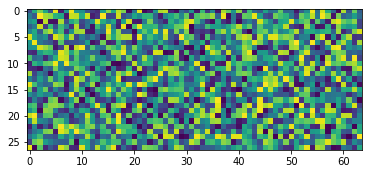

0.0


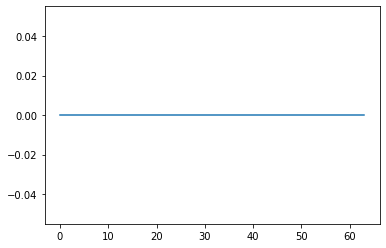

0.14795227


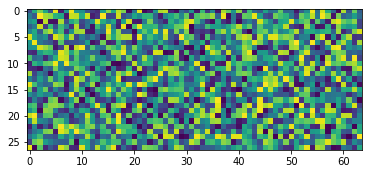

0.0


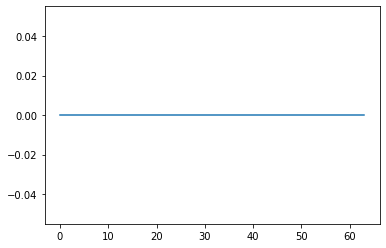

0.14795227


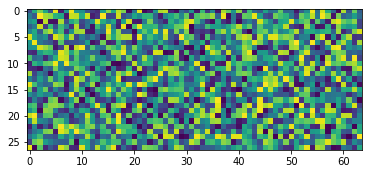

0.0


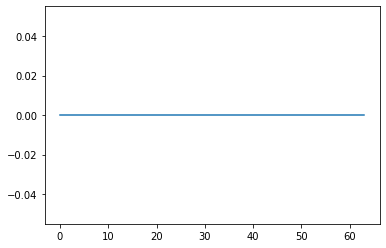

0.14795227


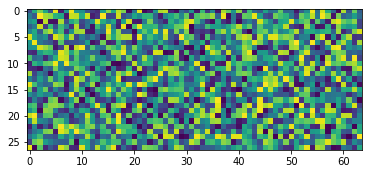

0.0


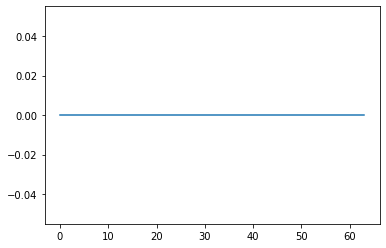

0.14795227


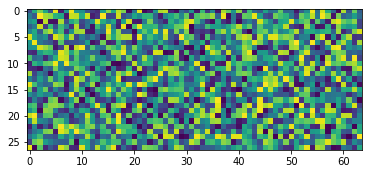

0.0


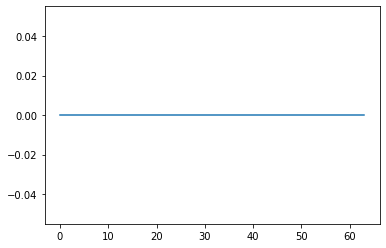

0.14794177


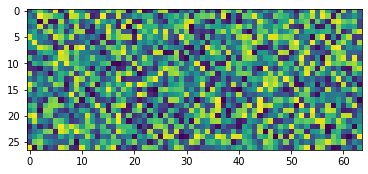

-0.00010937828


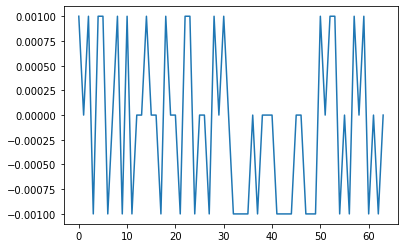

0.14792417


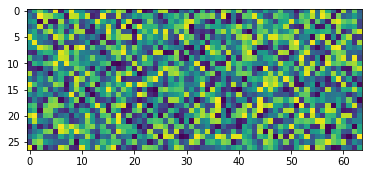

-0.00017381675


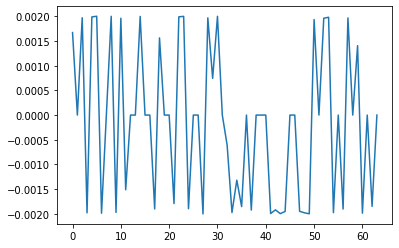

0.14790498


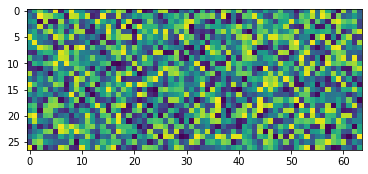

-0.0002192888


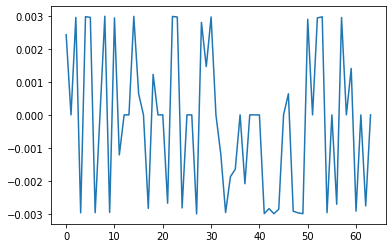

0.14788568


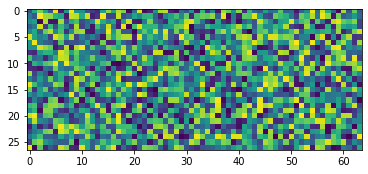

-0.0002579567


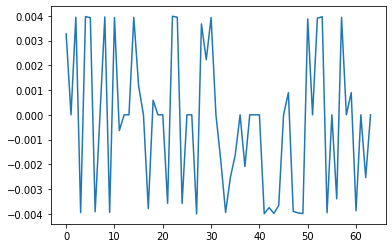

0.14787386


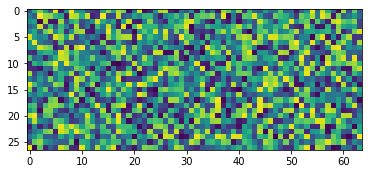

-0.00028417626


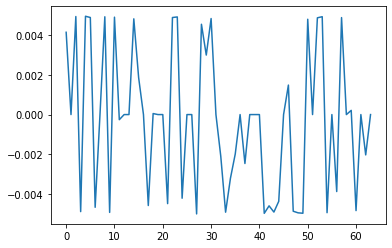

0.14786525


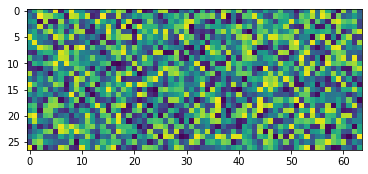

-0.00029104584


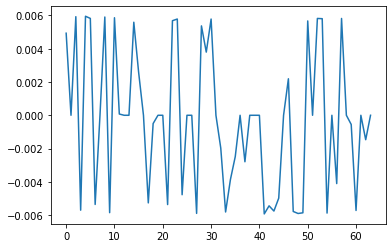

0.1478615


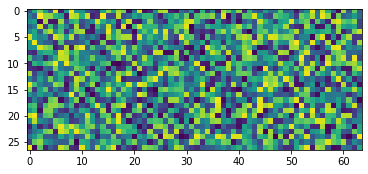

-0.00028960593


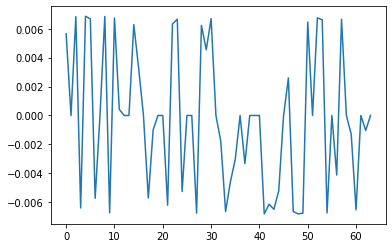

0.14786197


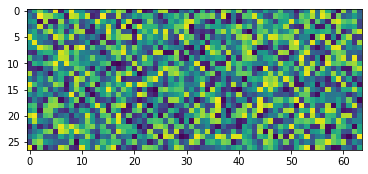

-0.00027282204


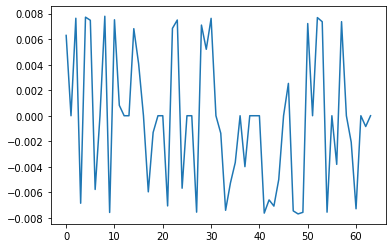

0.14787093


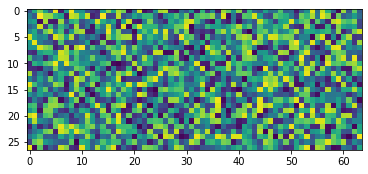

-0.0002496285


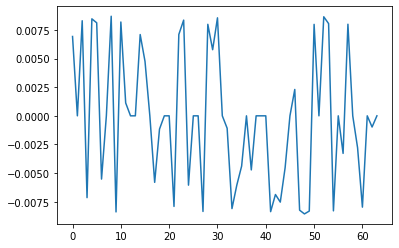

0.14788446


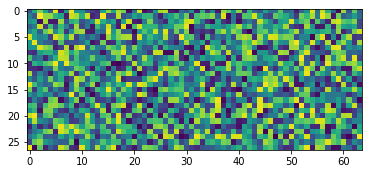

-0.00021983322


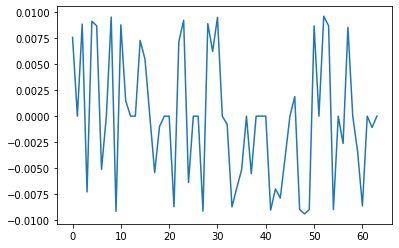

0.14789994


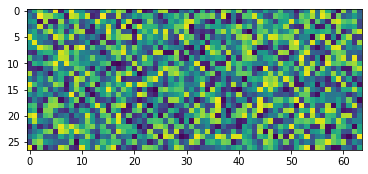

-0.00019117008


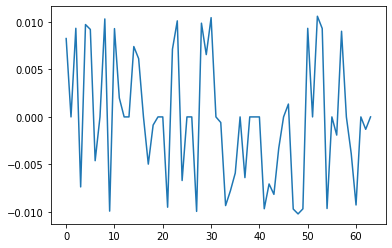

0.14791787


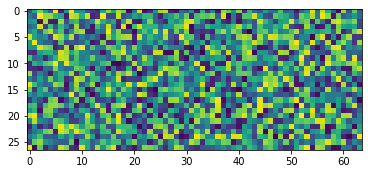

-0.0001601046


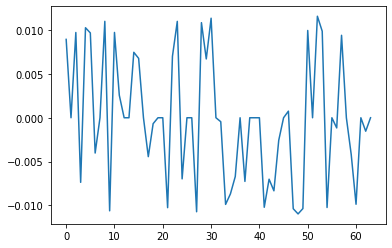

0.1479386


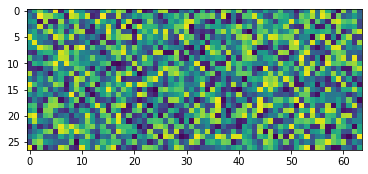

-0.00012660533


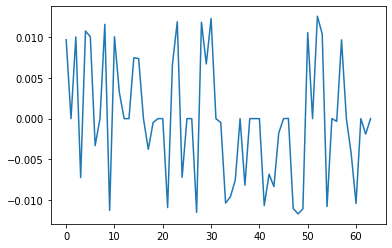

0.1479634


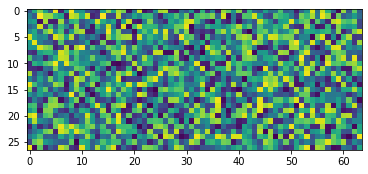

-9.224331e-05


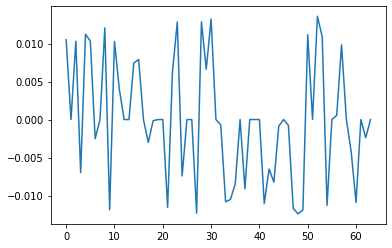

0.14799003


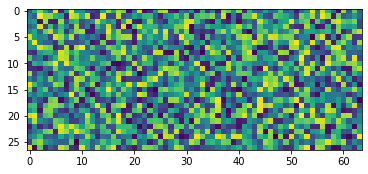

-6.0556864e-05


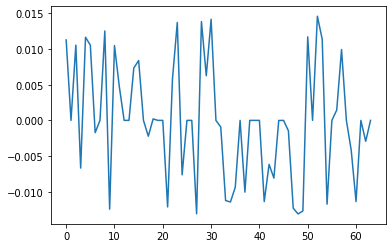

0.1480201


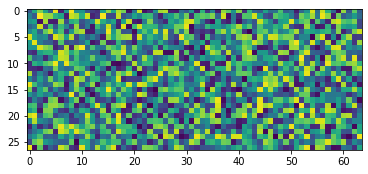

-2.3852219e-05


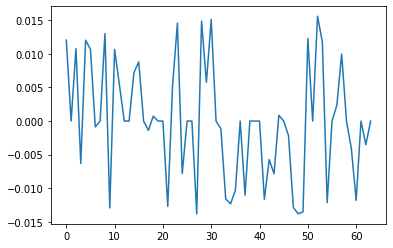

0.1480522


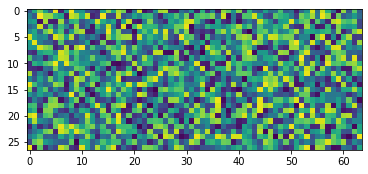

1.6721955e-05


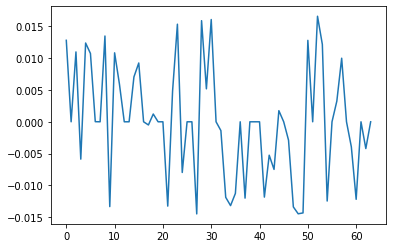

0.14808632


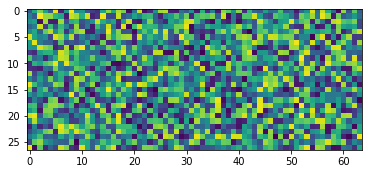

5.9380138e-05


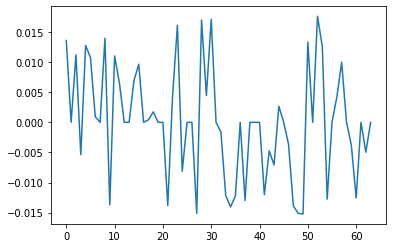

0.14812388


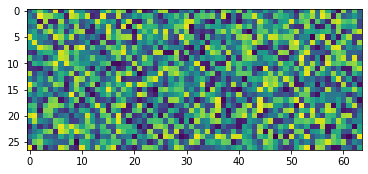

0.00011760485


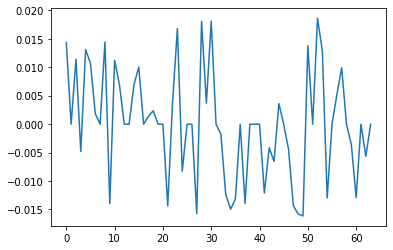

0.14816266


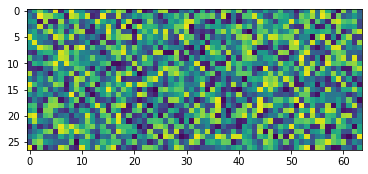

0.0001864974


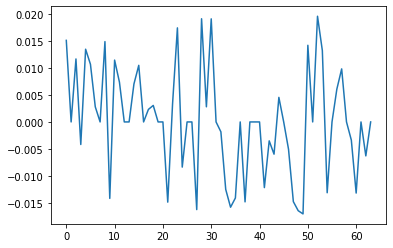

0.14820454


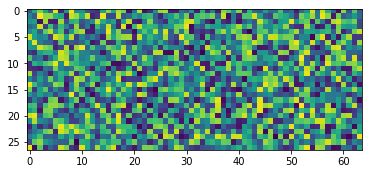

0.00027001963


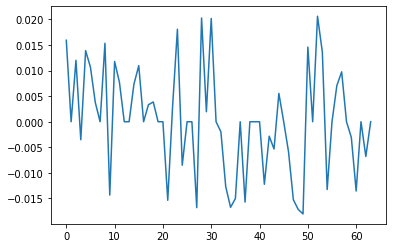

0.14824782


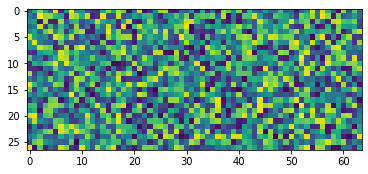

0.00037807936


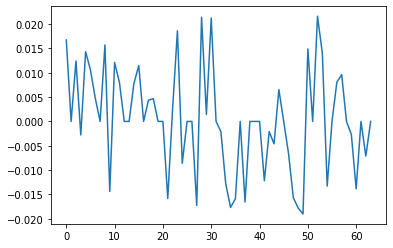

0.14829467


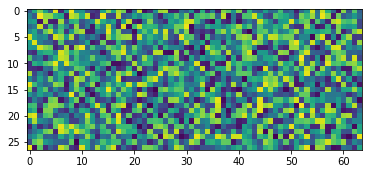

0.0005081472


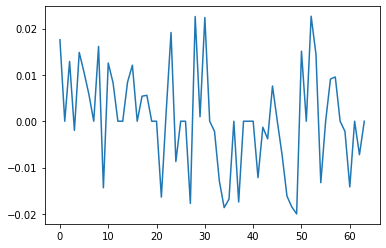

0.14834431


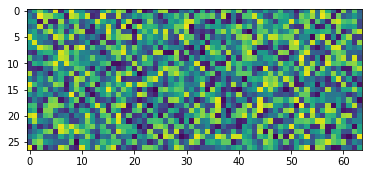

0.0006510976


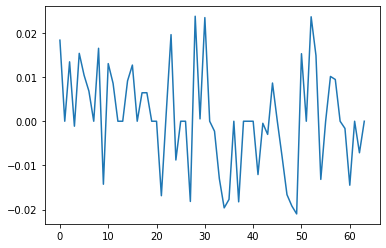

0.1483954


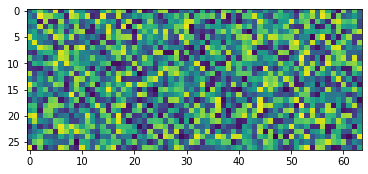

0.0008139047


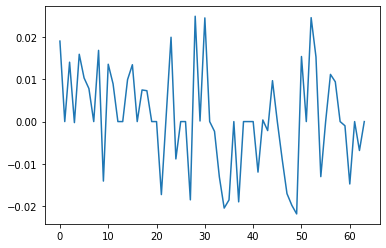

0.1484491


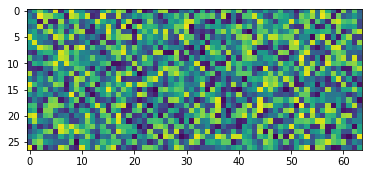

0.000995362


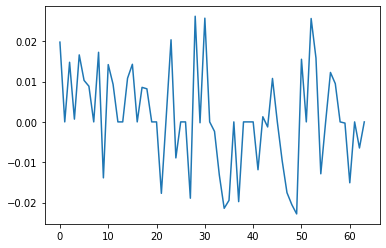

0.14850652


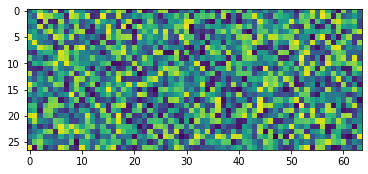

0.001199332


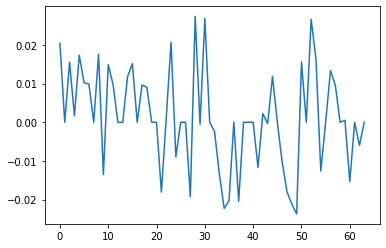

0.14856562


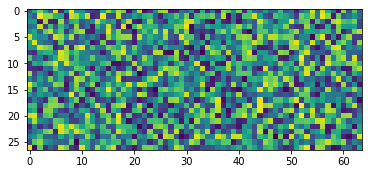

0.001412296


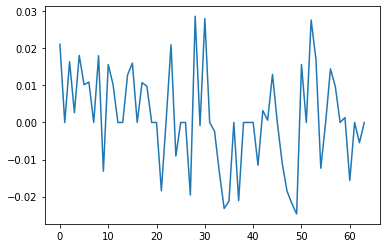

0.14862798


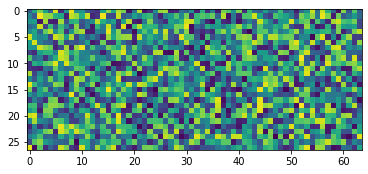

0.0016378695


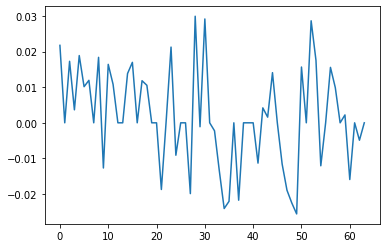

0.14869528


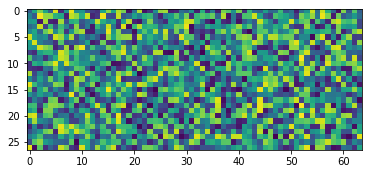

0.0018861784


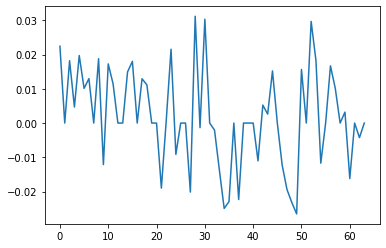

0.14876421


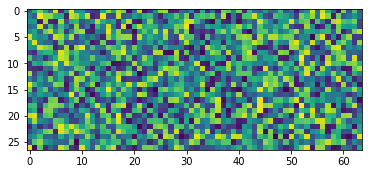

0.00214175


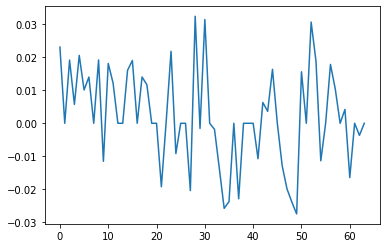

0.14883445


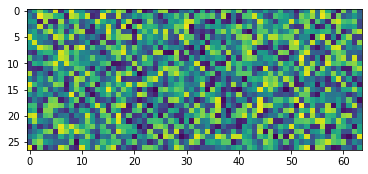

0.0024044255


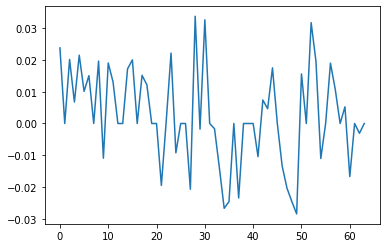

0.14890918


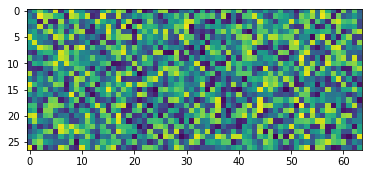

0.002691651


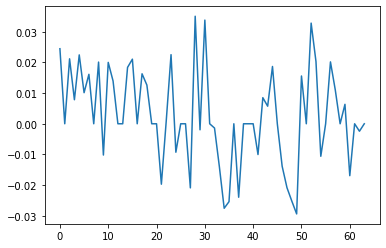

0.14898917


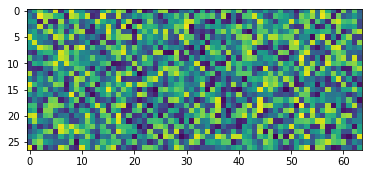

0.0030062015


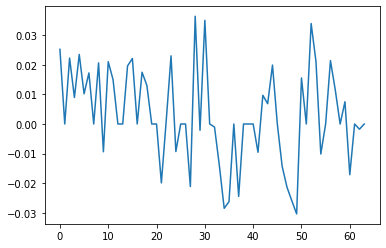

0.14907207


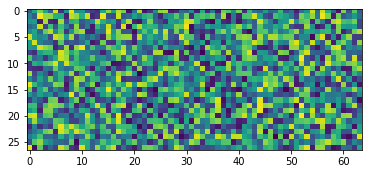

0.0033319765


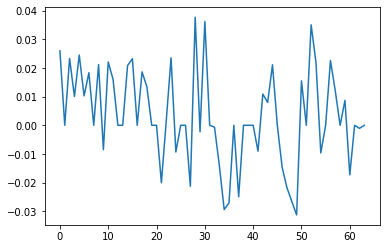

0.14915562


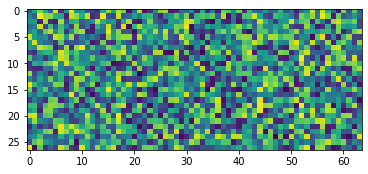

0.0036586993


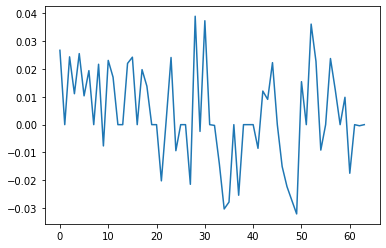

0.14924367


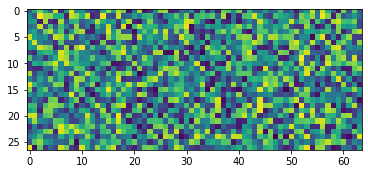

0.0040084487


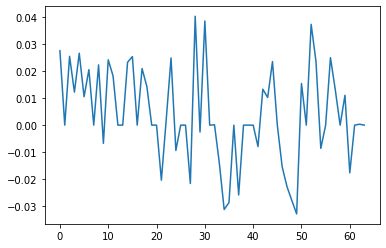

0.1493352


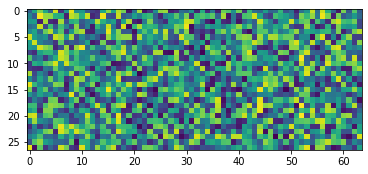

0.0043727057


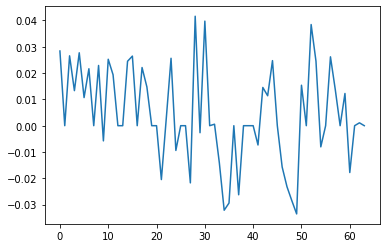

0.14943326


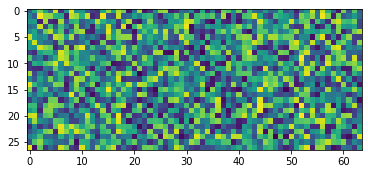

0.0047677048


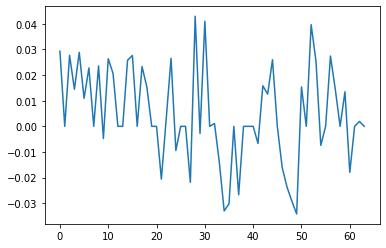

0.14953624


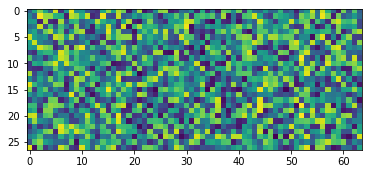

0.0051871827


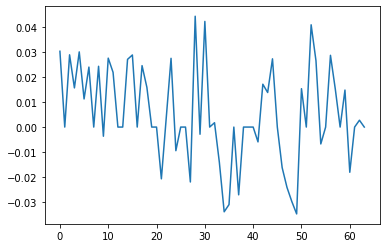

0.14964154


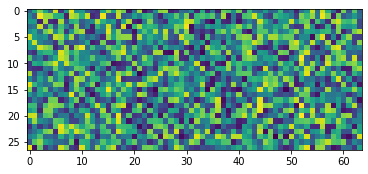

0.005616881


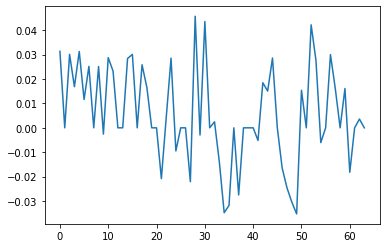

0.14975312


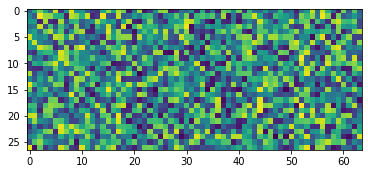

0.006078566


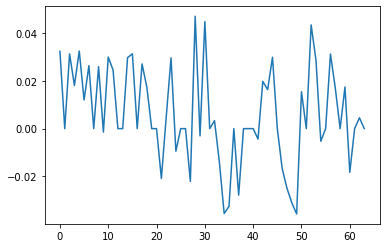

0.14987113


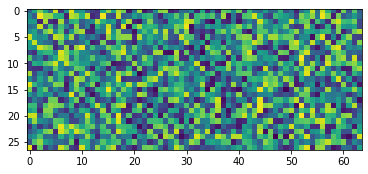

0.0065753628


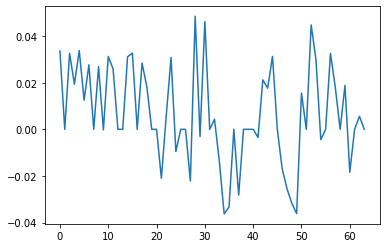

0.1499945


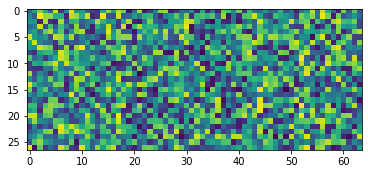

0.0070954375


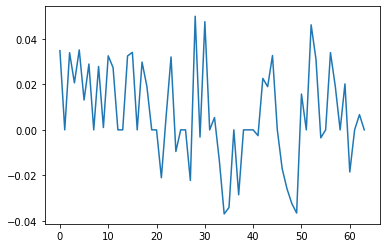

0.15012361


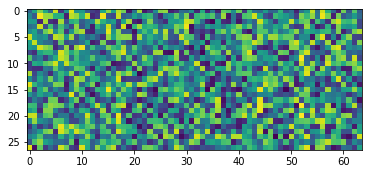

0.0076410547


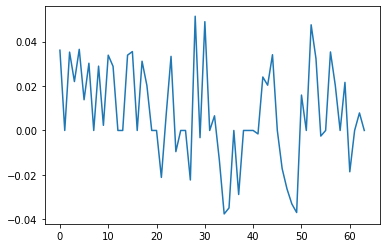

0.15025495


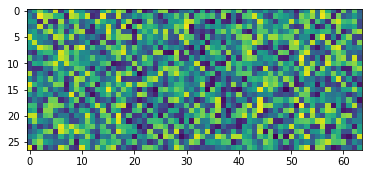

0.008195529


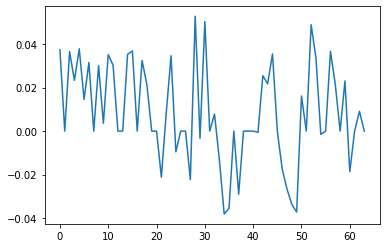

0.15038726


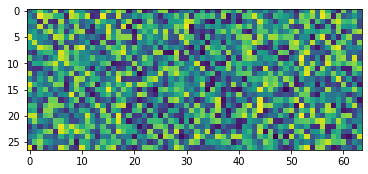

0.008755531


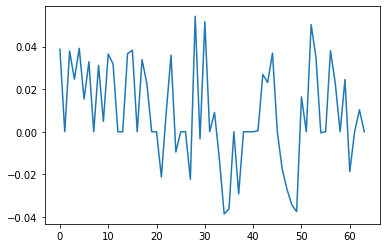

0.15052314


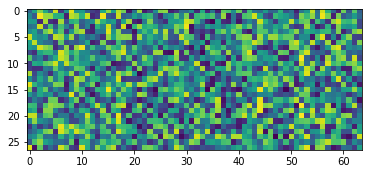

0.009334822


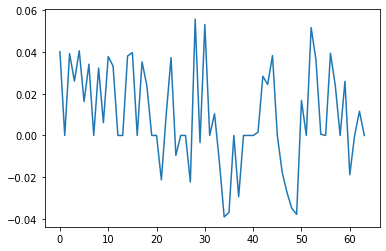

0.15066305


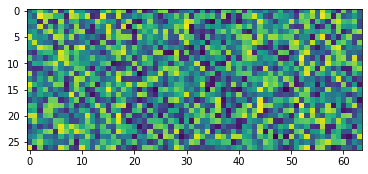

0.0099410415


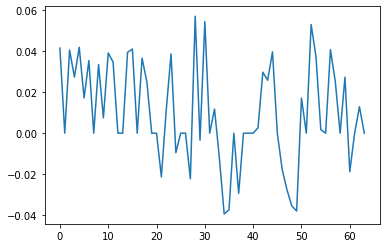

0.15080884


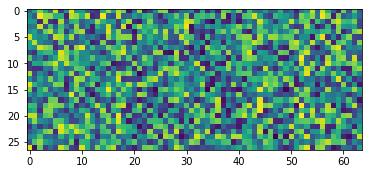

0.01057419


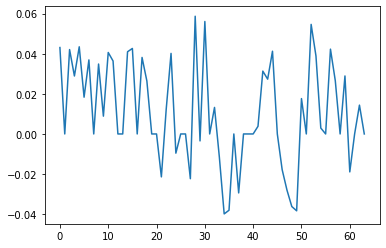

0.15095814


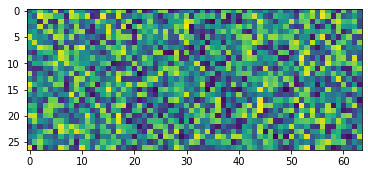

0.011221528


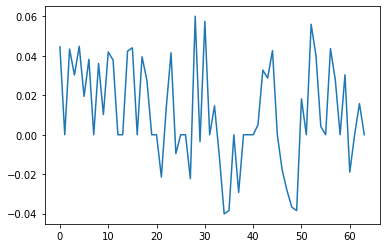

0.15111017


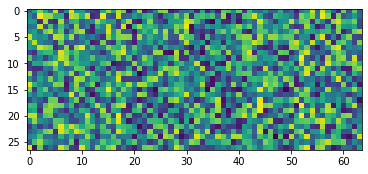

0.011873844


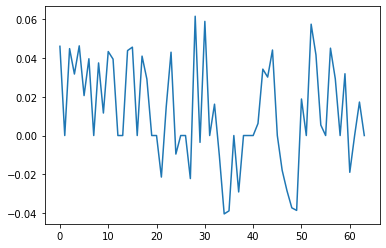

0.1512648


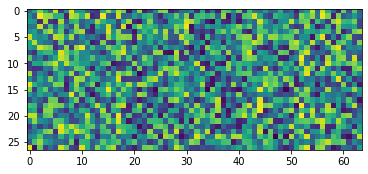

0.012543044


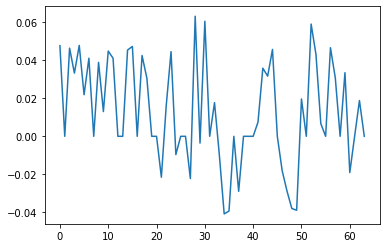

0.15142329


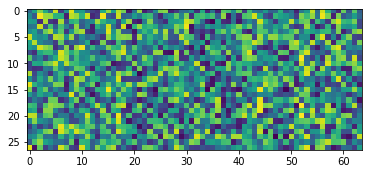

0.013233662


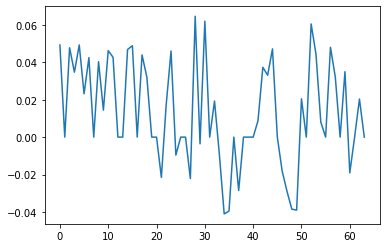

0.15158637


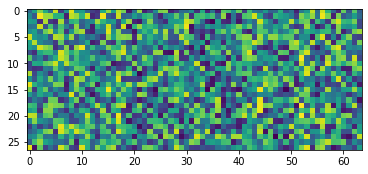

0.013944139


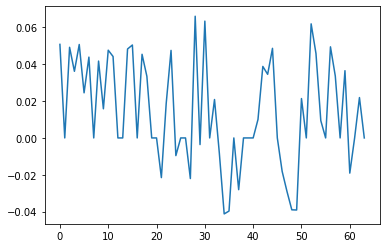

0.15175535


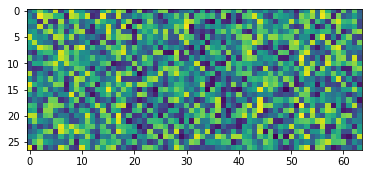

0.014681825


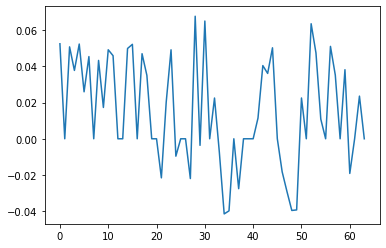

0.15192828


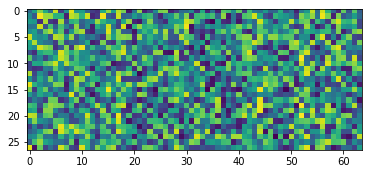

0.015433101


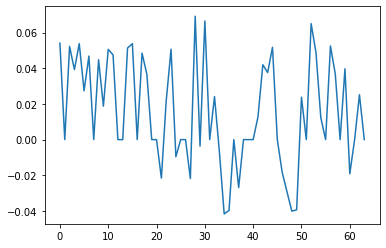

0.15210783


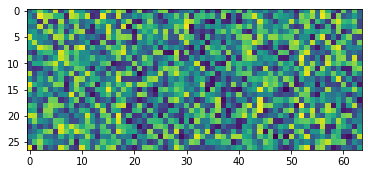

0.01619743


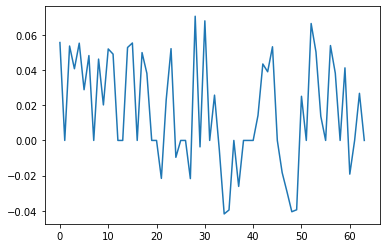

0.15228328


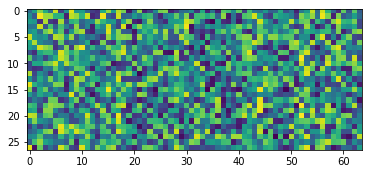

0.016951371


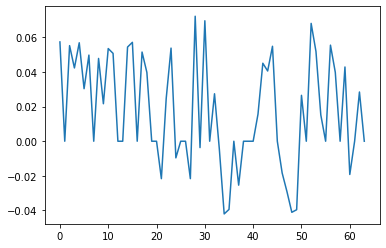

0.1524671


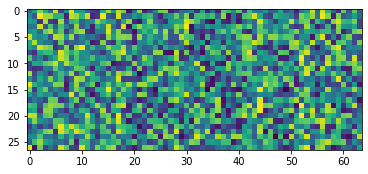

0.017735213


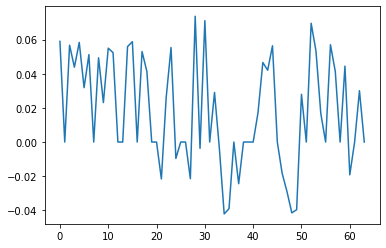

0.15266033


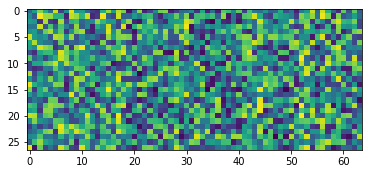

0.01855111


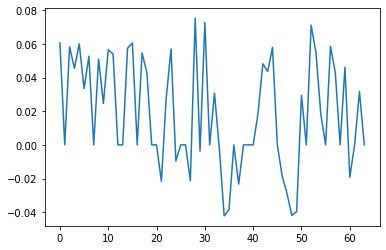

0.15285258


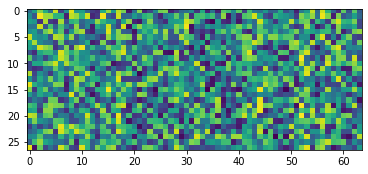

0.019372072


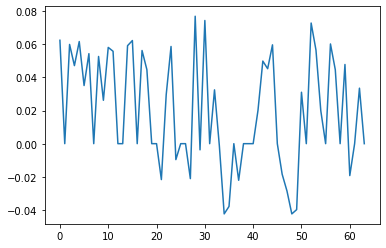

0.15305214


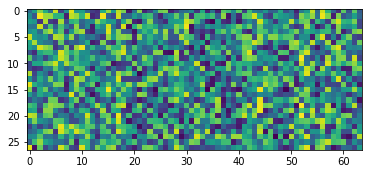

0.020221535


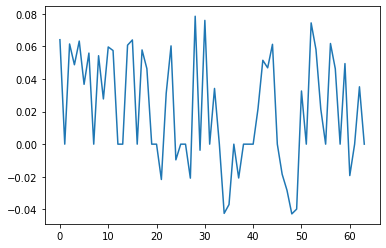

0.15325858


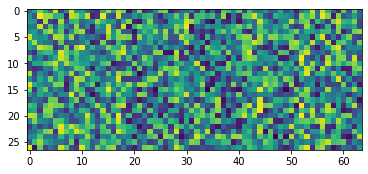

0.02108647


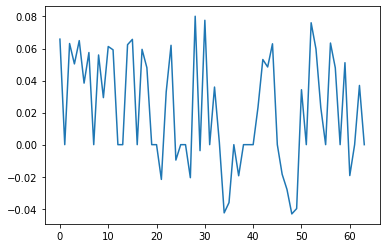

0.15346421


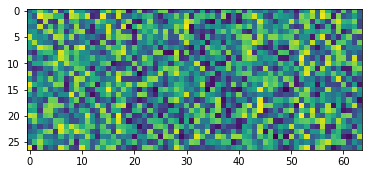

0.021952365


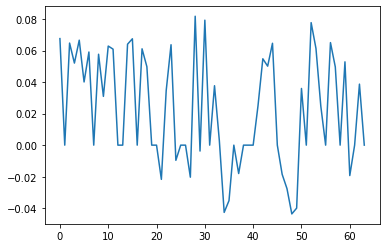

0.15367377


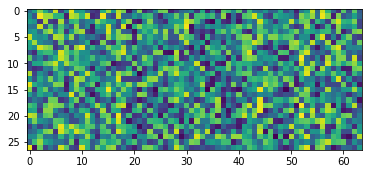

0.022833783


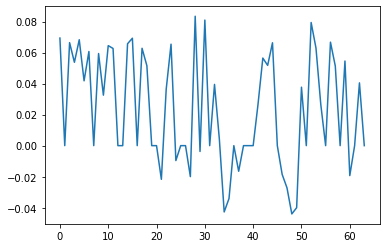

0.15388434


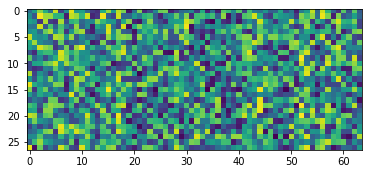

0.023715403


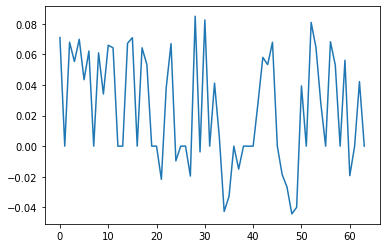

0.15409693


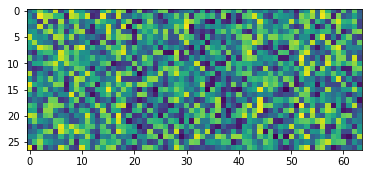

0.024598554


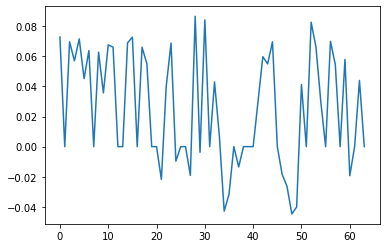

0.15431154


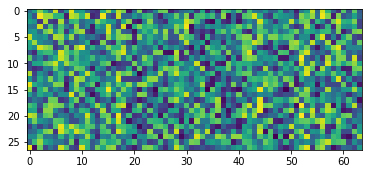

0.025485344


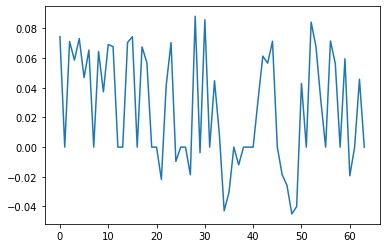

0.15453215


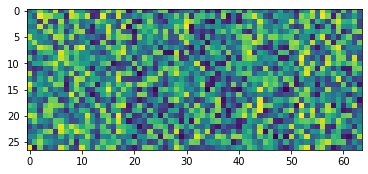

0.026392186


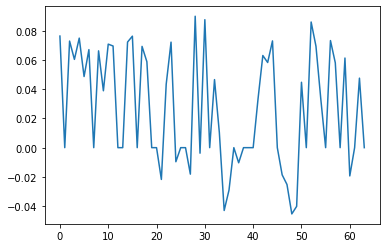

0.1547535


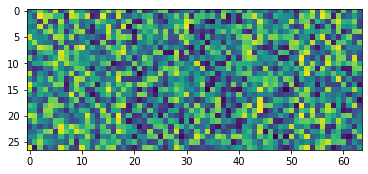

0.027288143


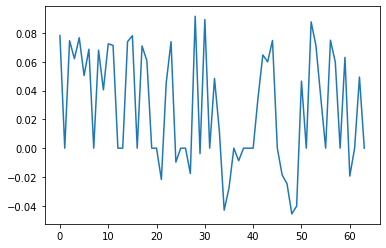

0.15498051


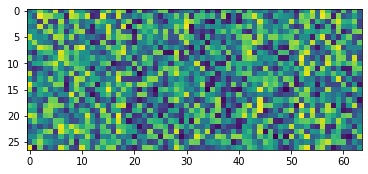

0.02821069


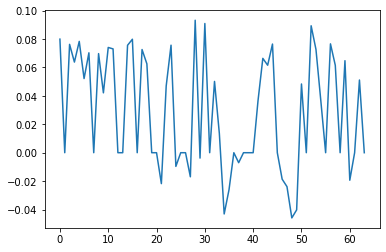

0.15520954


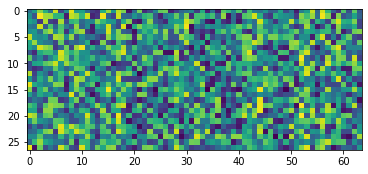

0.029149491


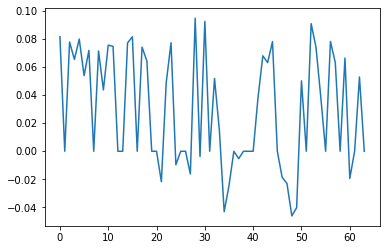

0.15544349


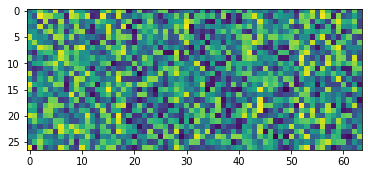

0.030087136


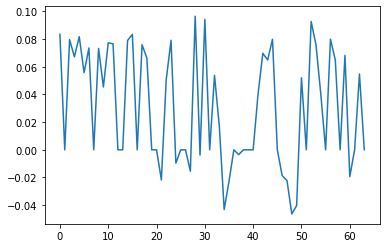

0.155686


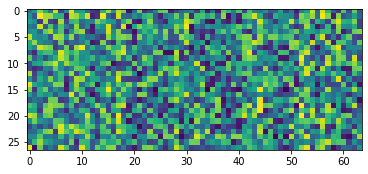

0.031042367


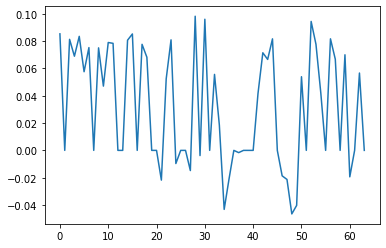

0.15592673


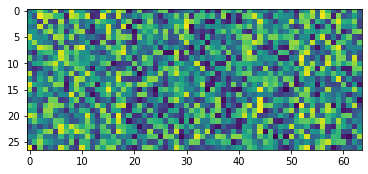

0.031976193


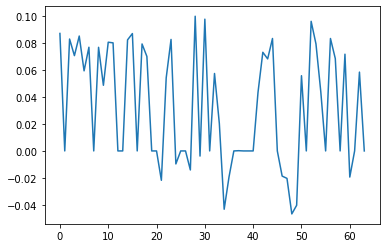

0.15616703


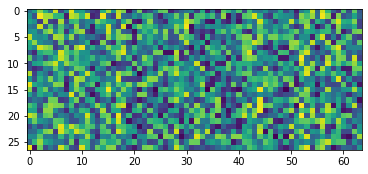

0.032903053


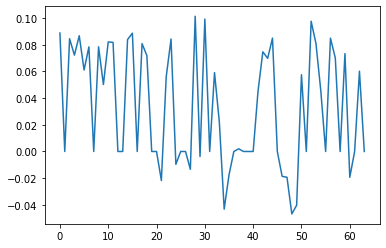

0.15641786


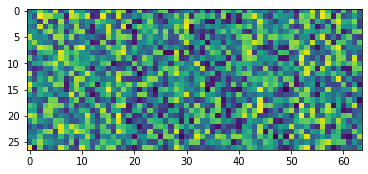

0.033860542


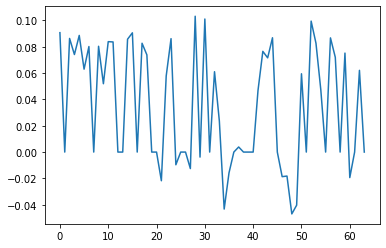

0.15666935


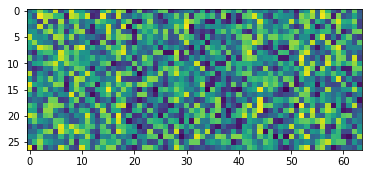

0.034797657


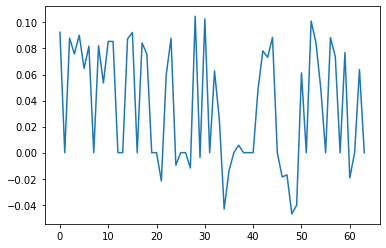

0.15692884


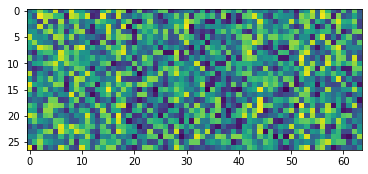

0.035763852


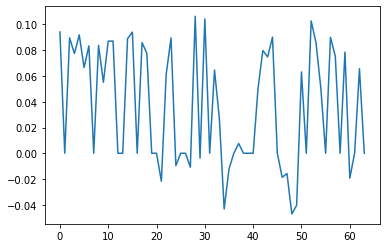

0.15719719


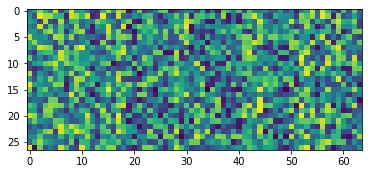

0.03675387


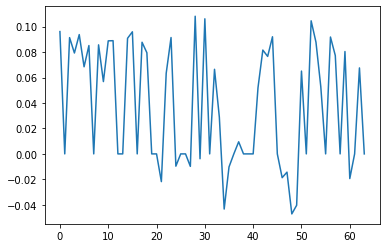

0.15746942


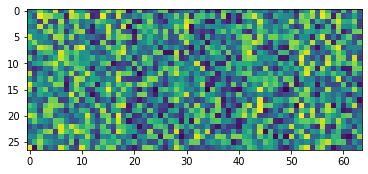

0.037754312


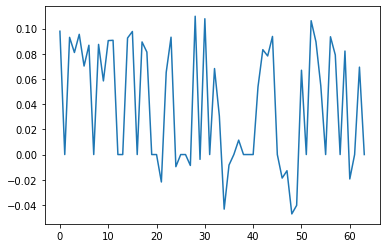

0.15774648


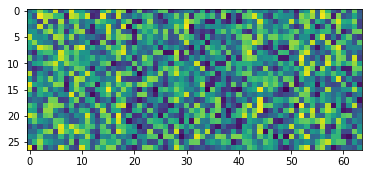

0.038757488


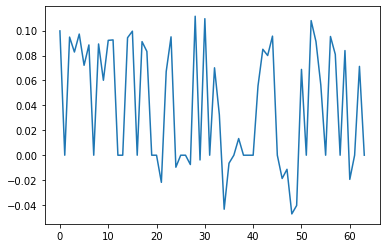

0.1580307


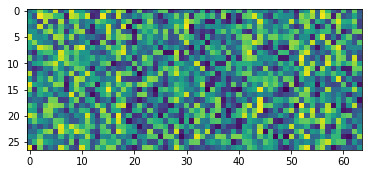

0.03977775


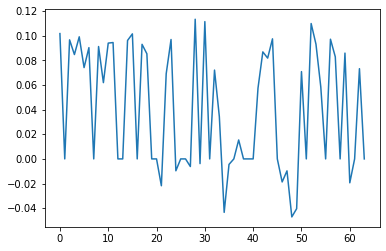

0.15831758


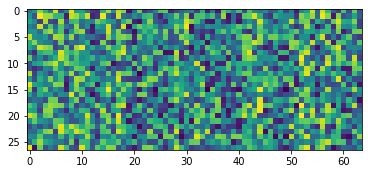

0.040793076


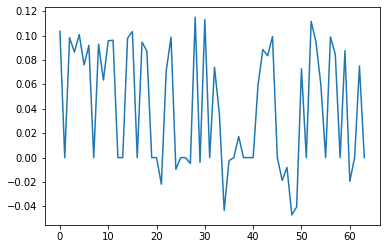

0.15861297


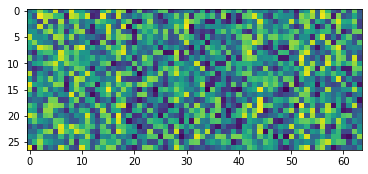

0.04181874


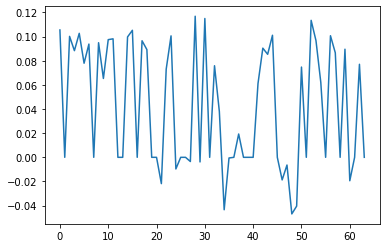

0.15891752


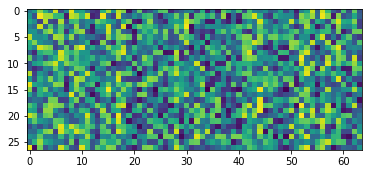

0.042860202


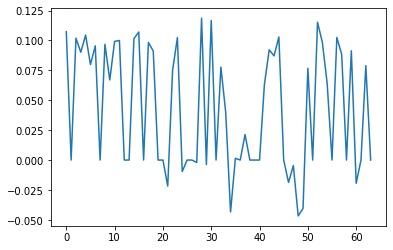

0.15923023


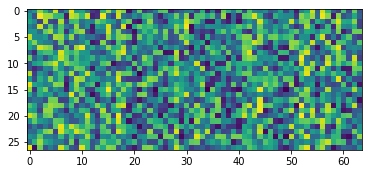

0.043910105


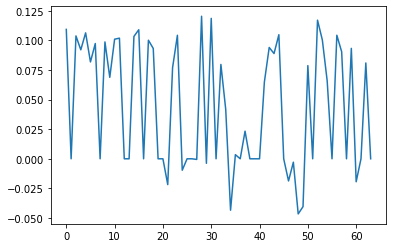

0.15954997


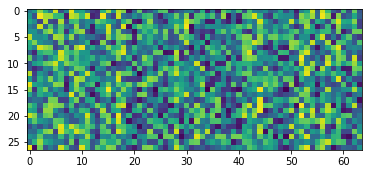

0.044966903


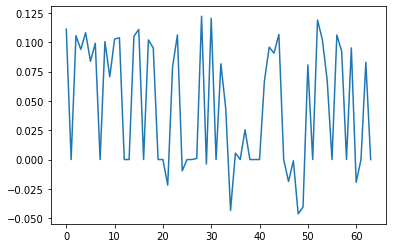

0.1598714


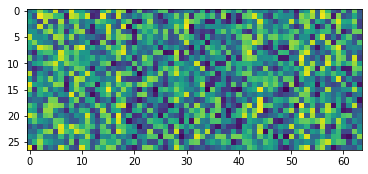

0.046015605


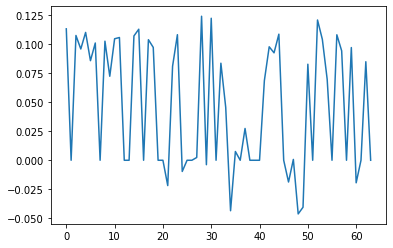

0.16020235


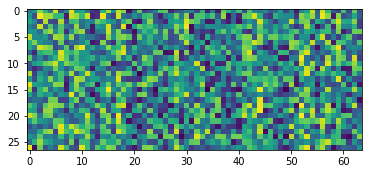

0.047073692


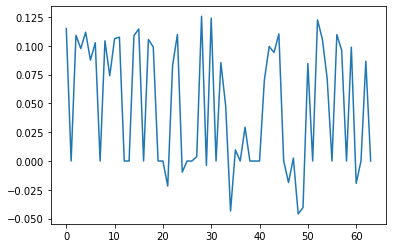

0.16054462


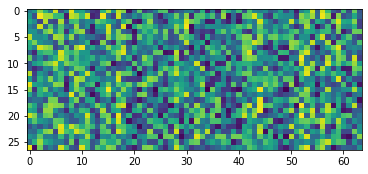

0.04815729


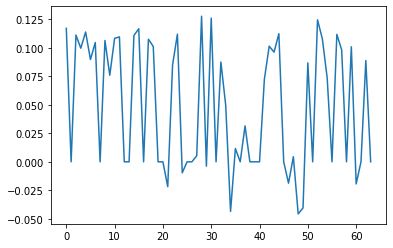

0.16089304


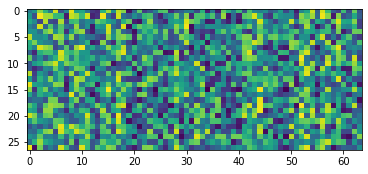

0.049259044


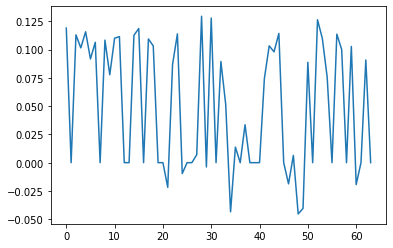

0.16125317


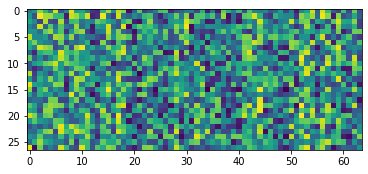

0.050378084


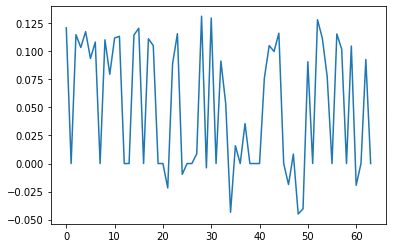

0.16161072


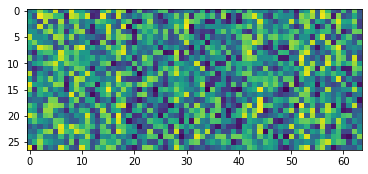

0.05148428


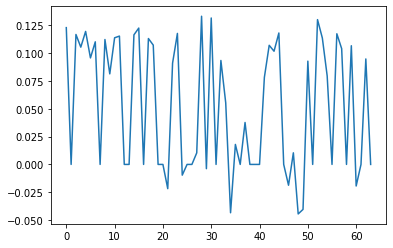

In [38]:
std1 = []
mean1 = []

for layer in layer1:
  if(len(layer.shape) == 2):
    std1.append(np.std(layer))
    print(np.std(layer))
    plt.imshow(layer)
    plt.show()
  else:
    mean1.append(np.mean(layer))
    print(np.mean(layer))
    plt.plot(layer)
    plt.show()

0.12446684


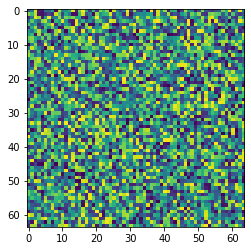

0.0


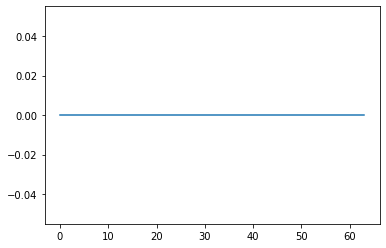

0.12446684


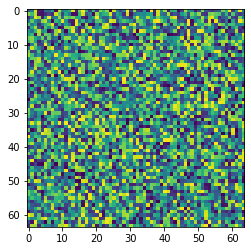

0.0


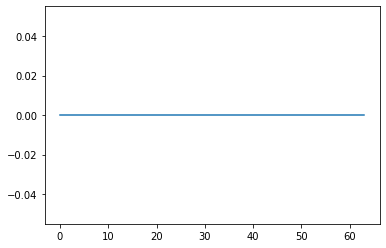

0.12446684


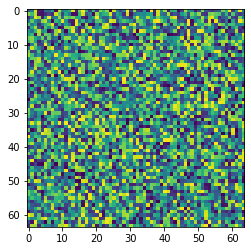

0.0


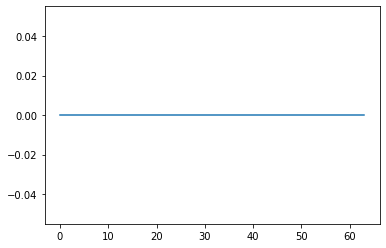

0.12446684


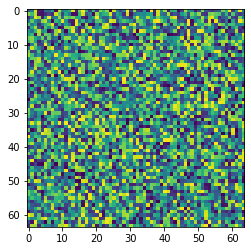

0.0


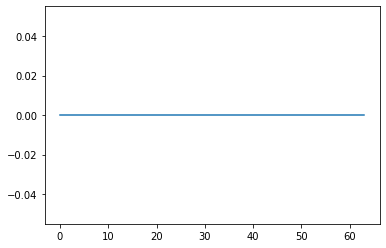

0.12446684


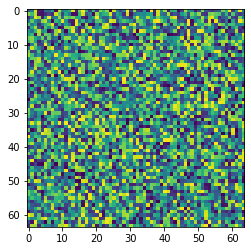

0.0


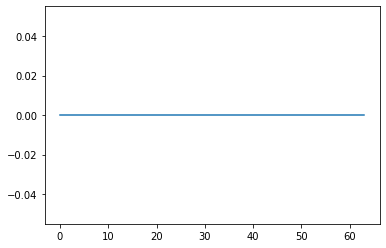

0.124454685


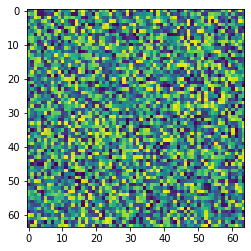

-0.00021875653


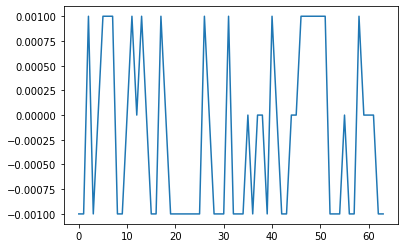

0.124446556


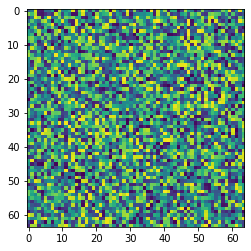

-0.00040500943


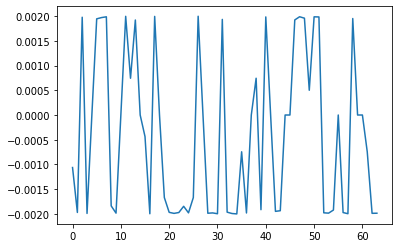

0.124440305


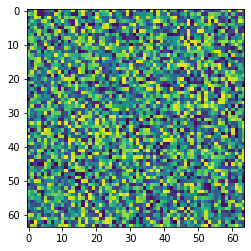

-0.0005939965


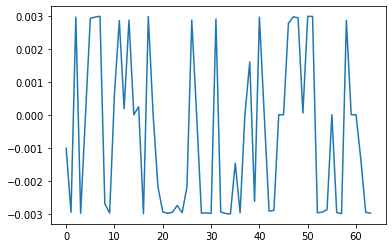

0.124433085


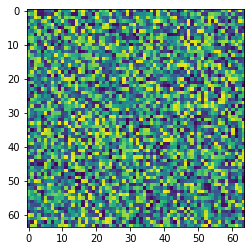

-0.0007761122


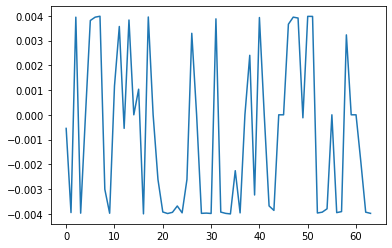

0.12442818


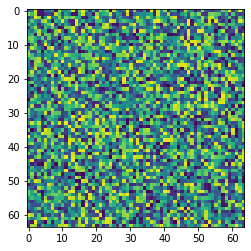

-0.0009615763


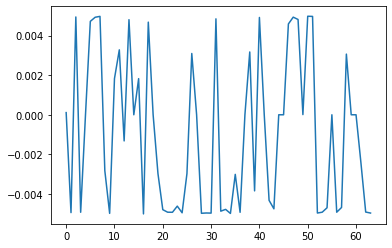

0.124426365


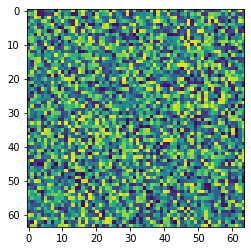

-0.0011283623


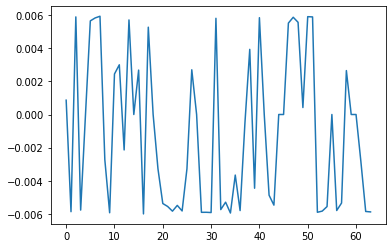

0.124425635


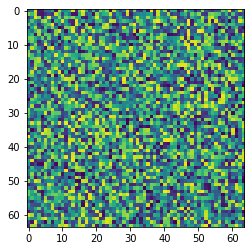

-0.0012835942


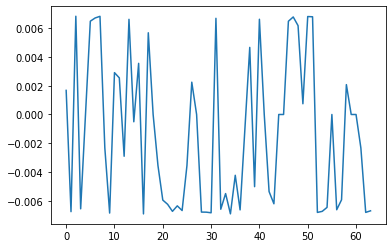

0.12442609


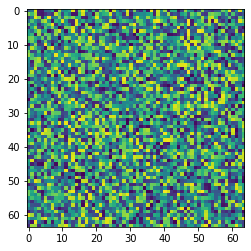

-0.0014425868


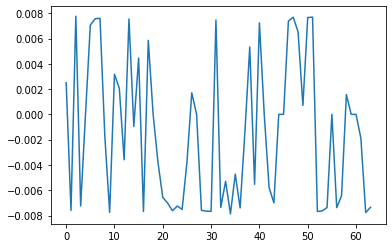

0.1244254


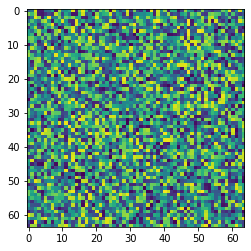

-0.0016085748


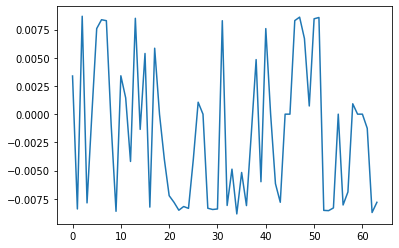

0.12442669


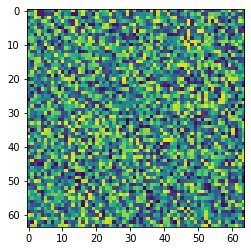

-0.0017642122


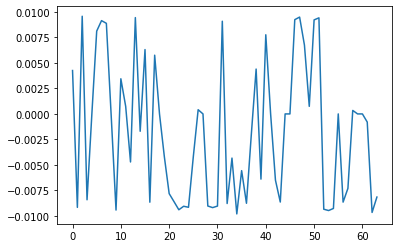

0.12442951


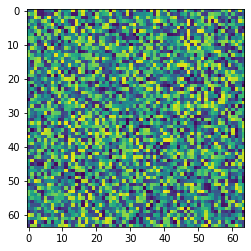

-0.0019058461


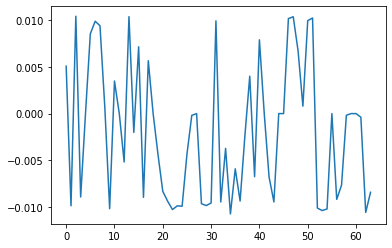

0.124434195


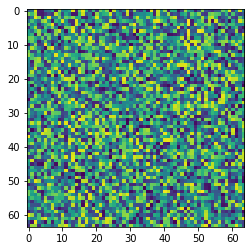

-0.0020275866


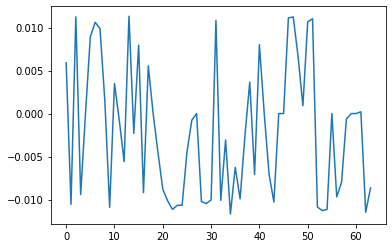

0.12444016


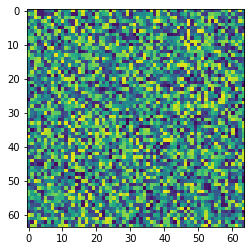

-0.0021287359


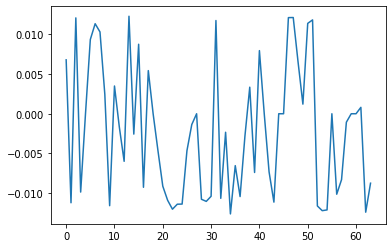

0.12444762


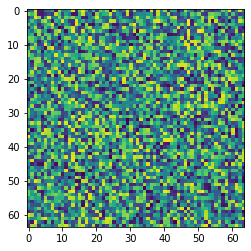

-0.0022103703


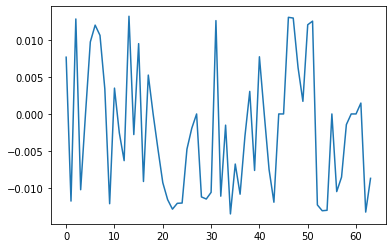

0.12445673


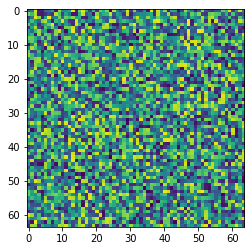

-0.0022739638


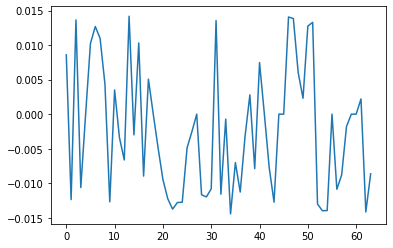

0.12446785


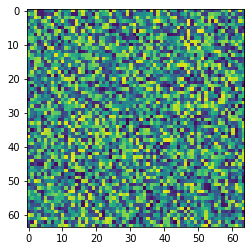

-0.0023176193


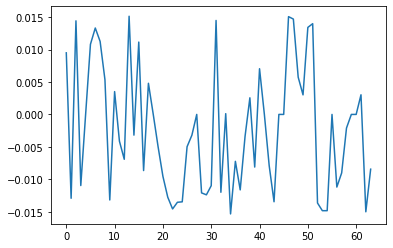

0.12448034


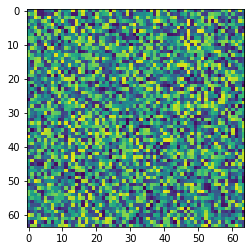

-0.0023391726


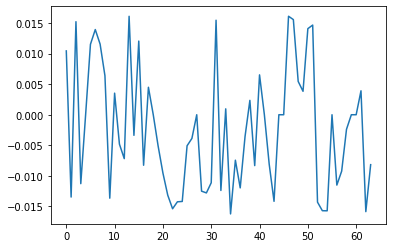

0.12449429


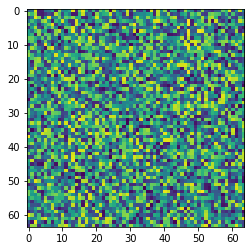

-0.002342044


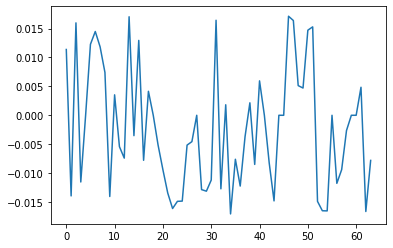

0.12451034


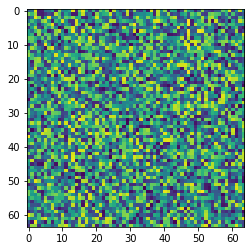

-0.0023224421


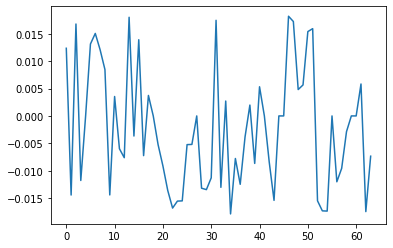

0.12452792


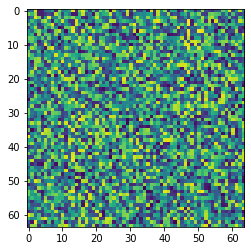

-0.0022867944


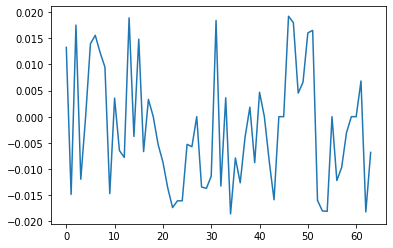

0.12454787


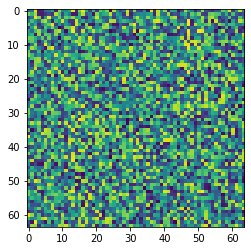

-0.0022302074


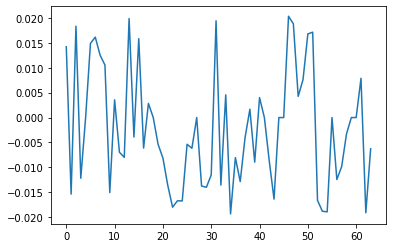

0.124569975


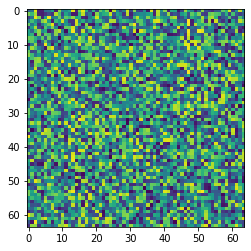

-0.0021517812


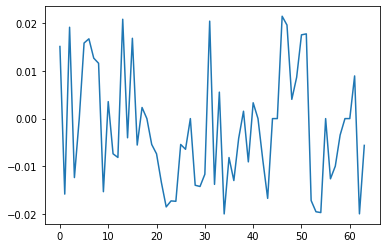

0.12459443


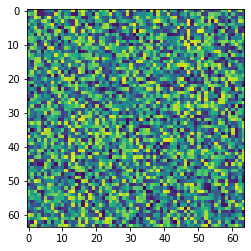

-0.002052433


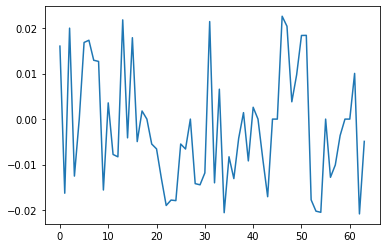

0.12462082


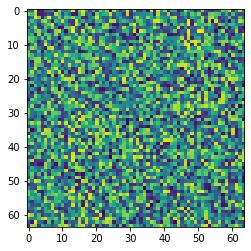

-0.0019384788


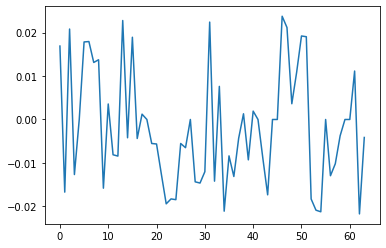

0.124648556


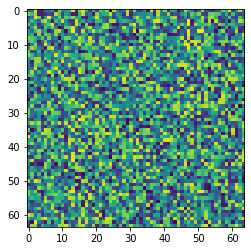

-0.0018099337


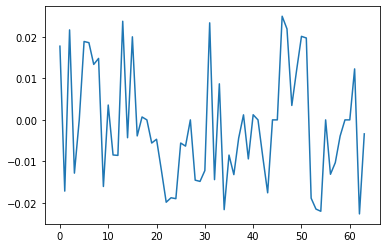

0.12467858


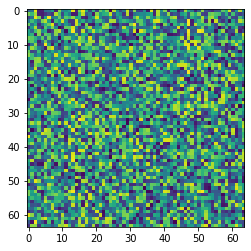

-0.001665918


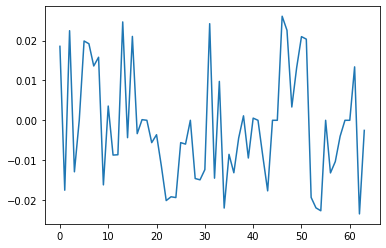

0.12471075


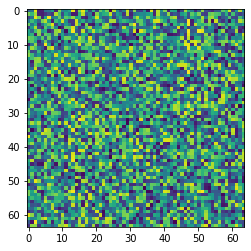

-0.0015041158


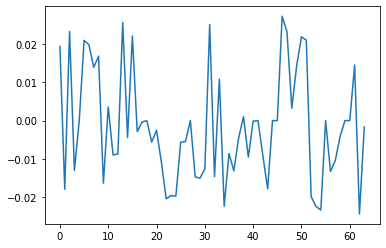

0.12474481


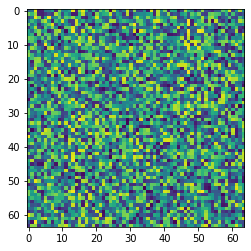

-0.0013335911


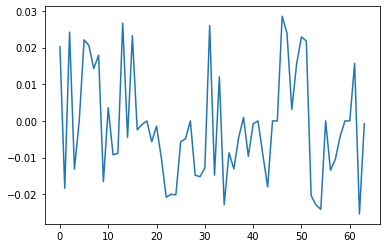

0.12477962


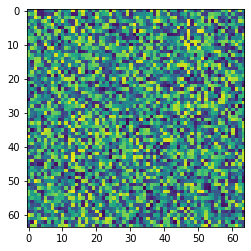

-0.001151725


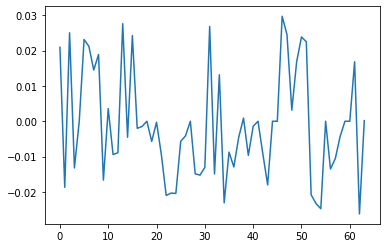

0.12481737


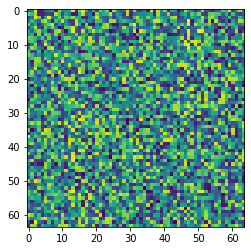

-0.0009521925


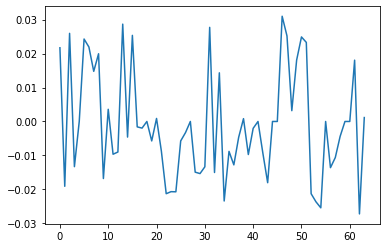

0.12485652


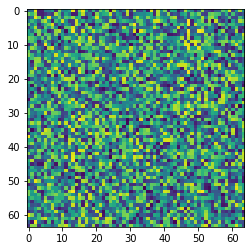

-0.0007463368


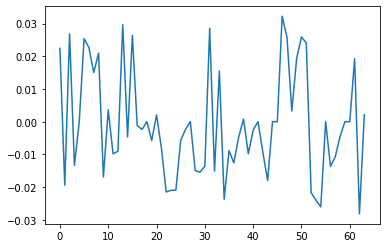

0.12489691


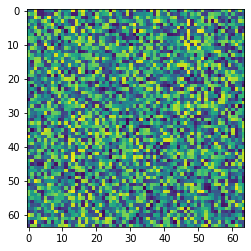

-0.0005341067


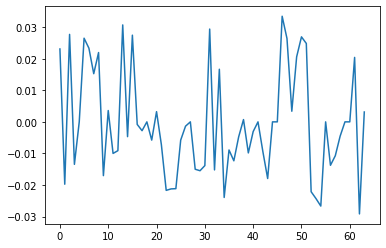

0.12493994


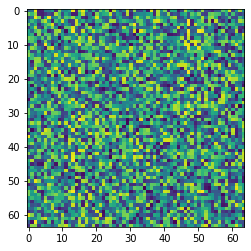

-0.00030462633


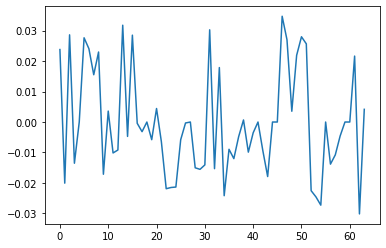

0.12498641


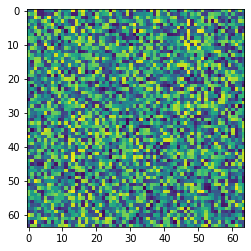

-5.5411394e-05


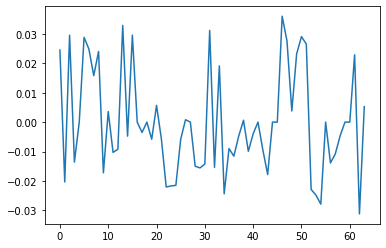

0.12503426


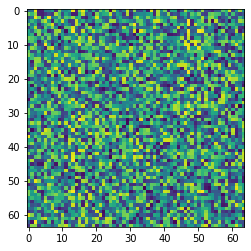

0.00020079743


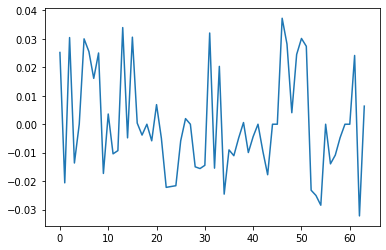

0.12508263


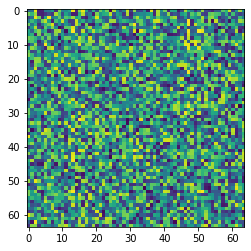

0.00045568545


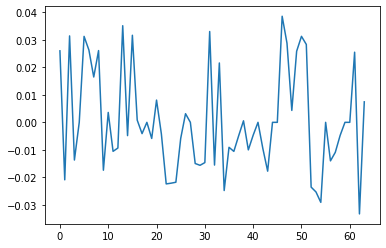

0.12513354


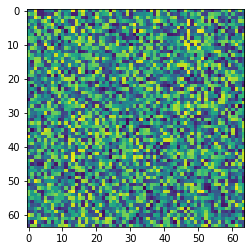

0.00072457583


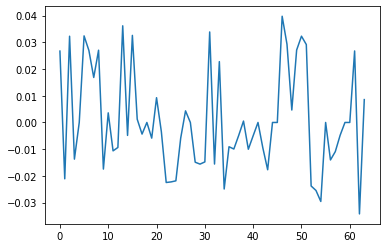

0.1251861


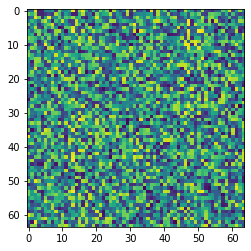

0.0010020765


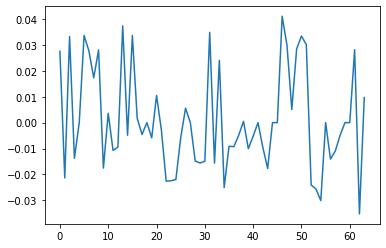

0.12524198


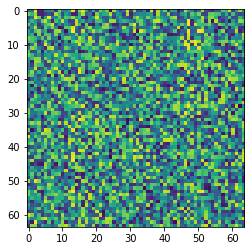

0.001299513


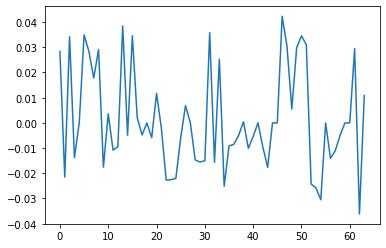

0.12530114


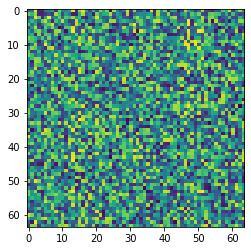

0.0016121434


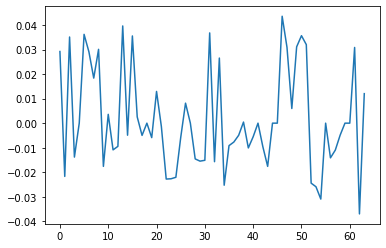

0.12536182


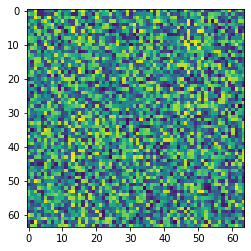

0.0019279951


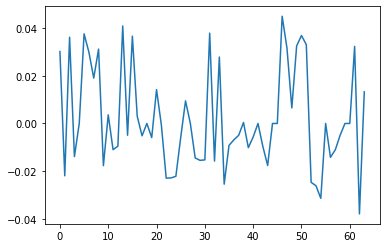

0.12542626


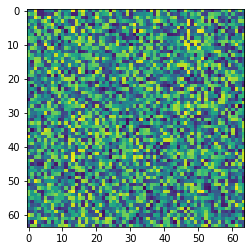

0.0022625674


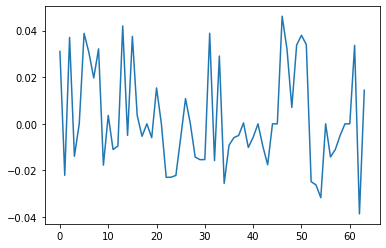

0.12549493


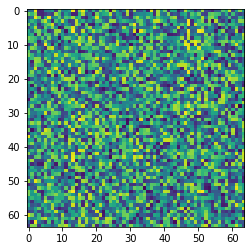

0.0026193028


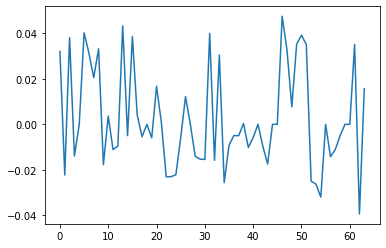

0.12556644


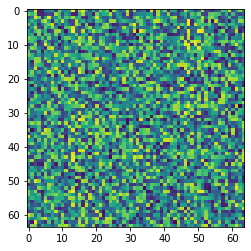

0.0029900498


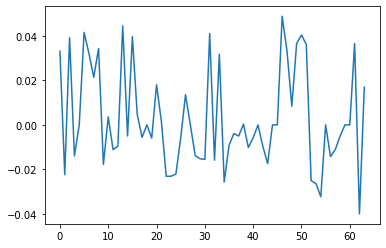

0.12564158


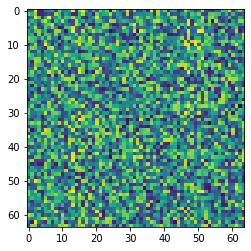

0.0033762986


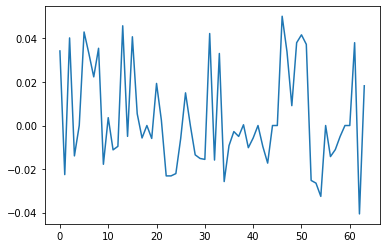

0.12571892


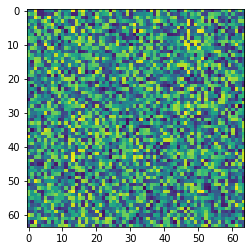

0.0037652866


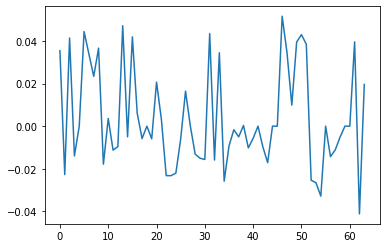

0.12579788


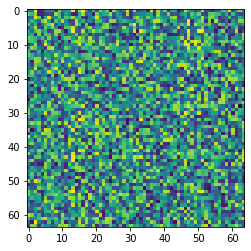

0.0041537397


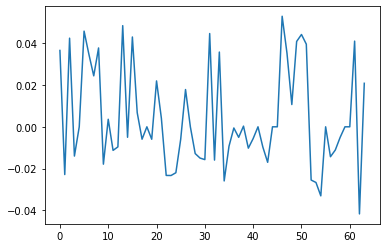

0.12587993


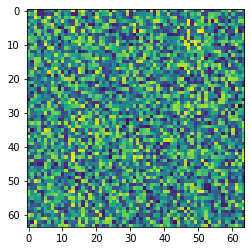

0.0045501906


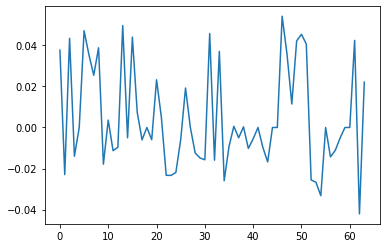

0.1259669


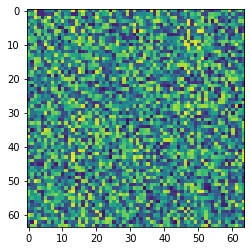

0.004963193


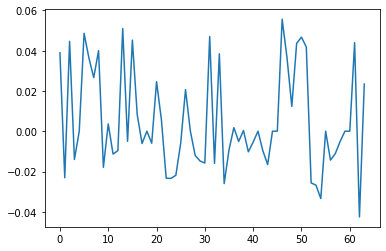

0.1260589


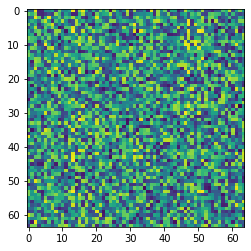

0.005392166


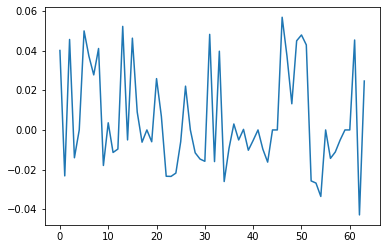

0.12615338


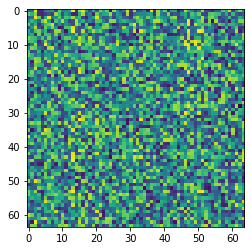

0.005826838


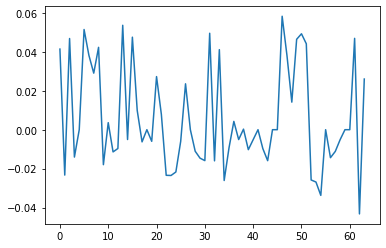

0.12624985


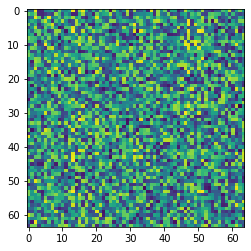

0.0062600817


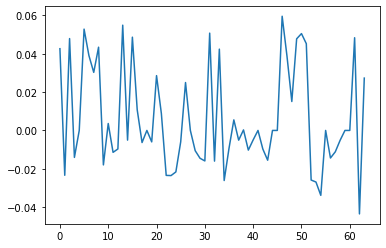

0.12635006


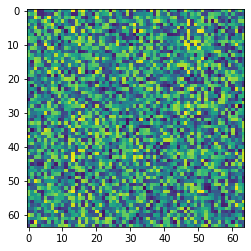

0.0067001255


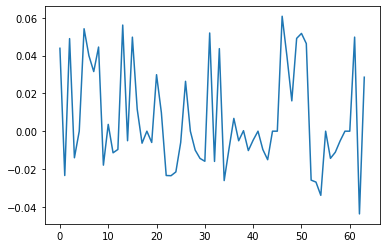

0.1264546


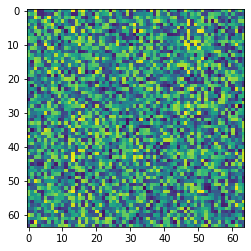

0.0071511413


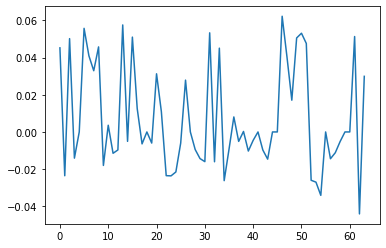

0.1265634


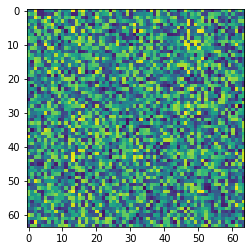

0.0076125762


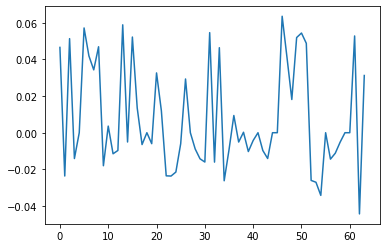

0.12667732


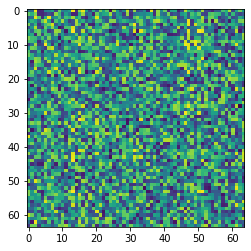

0.008091144


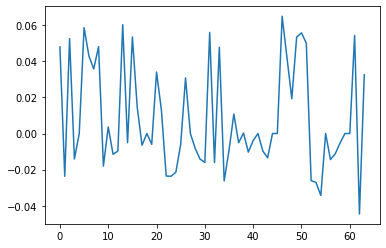

0.12679474


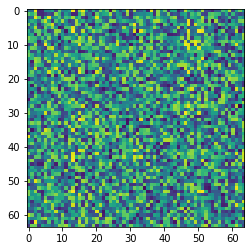

0.008574459


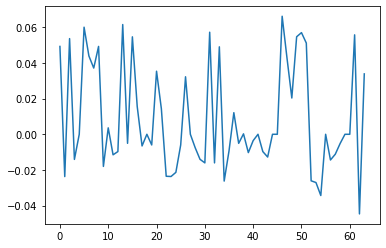

0.1269159


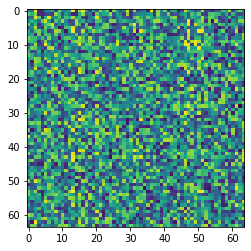

0.009063768


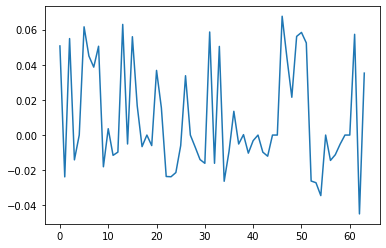

0.12703685


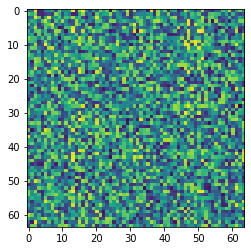

0.00954103


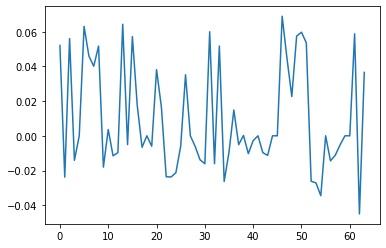

0.12716445


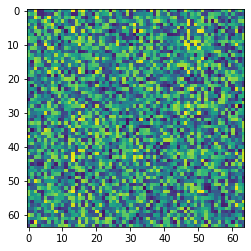

0.010038216


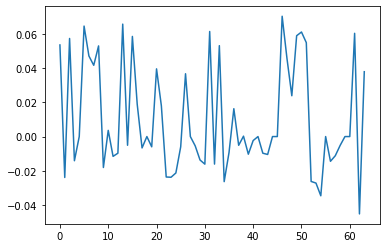

0.12729928


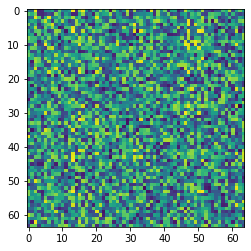

0.010562271


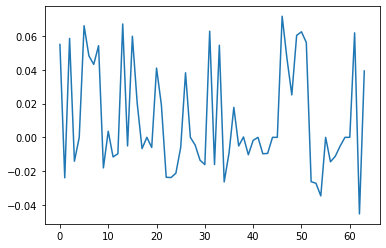

0.12743704


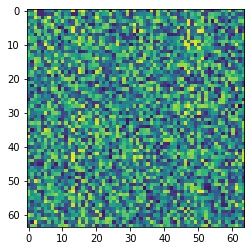

0.011084336


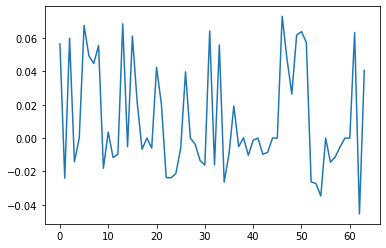

0.12758185


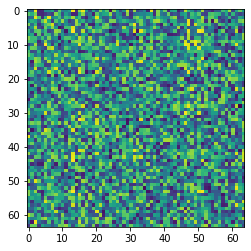

0.011630439


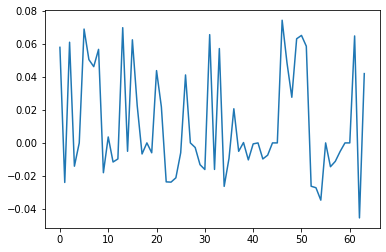

0.12773132


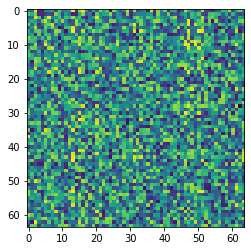

0.012187232


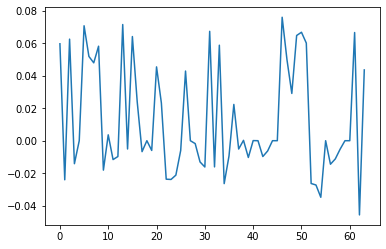

0.12788323


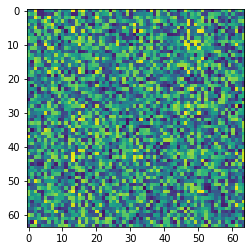

0.012738736


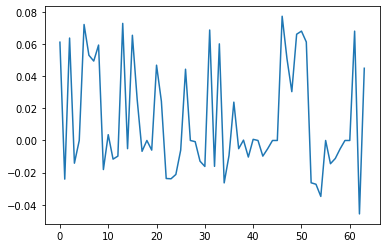

0.1280401


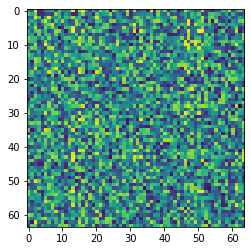

0.013298728


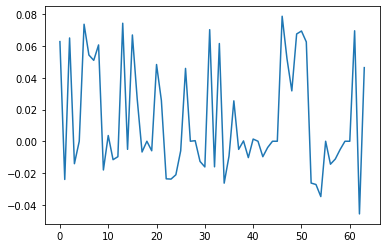

0.1281994


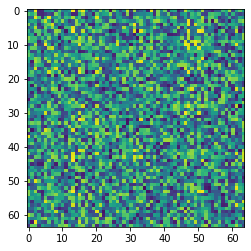

0.013855223


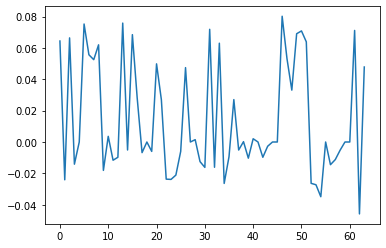

0.1283612


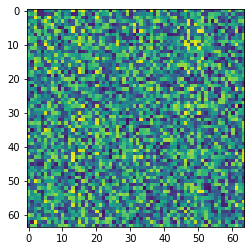

0.014409678


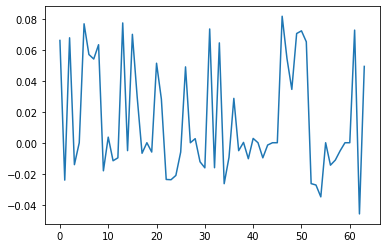

0.12852618


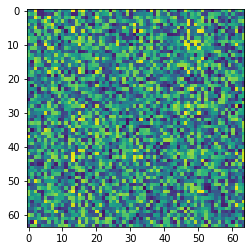

0.014963377


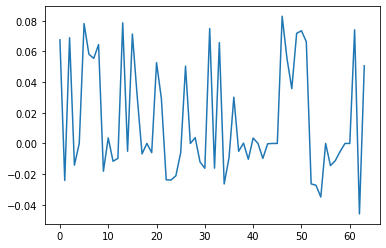

0.12869781


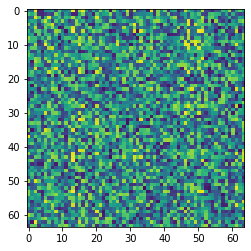

0.015530103


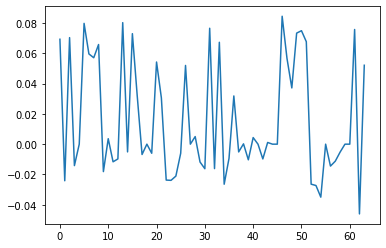

0.12886949


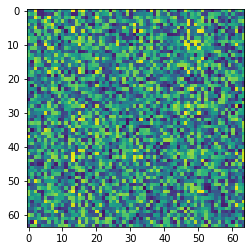

0.016086716


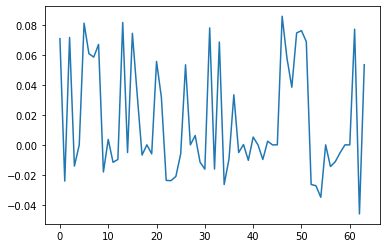

0.12904914


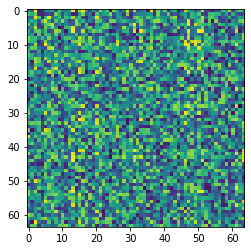

0.016662253


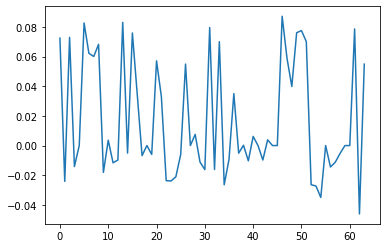

0.1292352


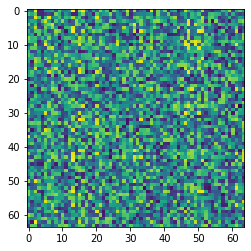

0.017246345


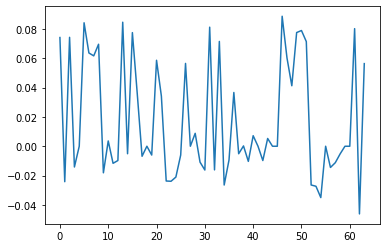

0.12942336


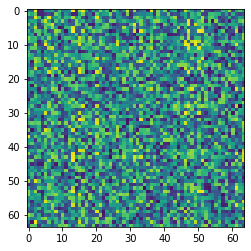

0.017831


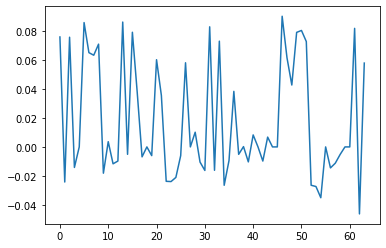

0.12961783


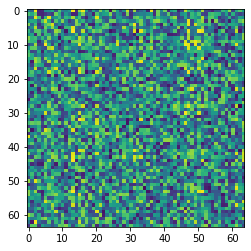

0.01843037


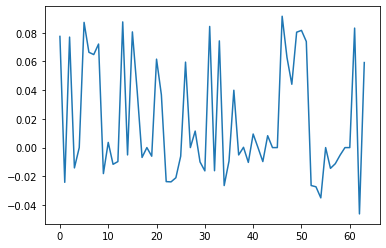

0.12981075


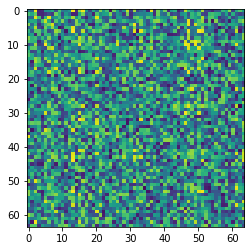

0.019013416


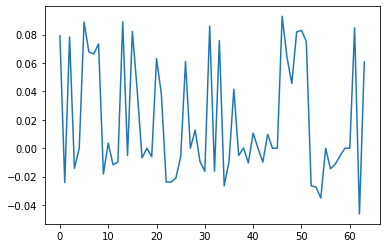

0.1300051


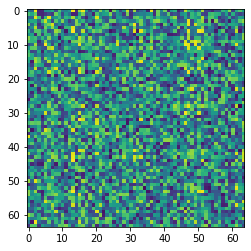

0.019588258


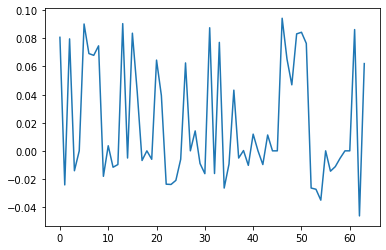

0.1302087


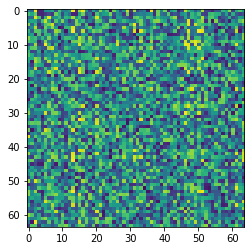

0.020187177


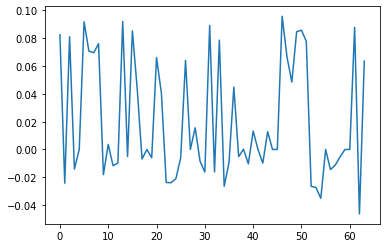

0.13041006


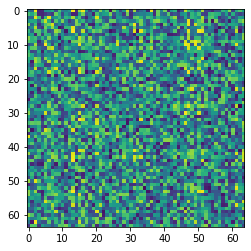

0.020771652


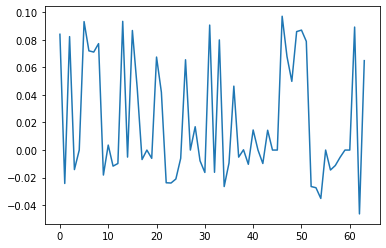

0.13062096


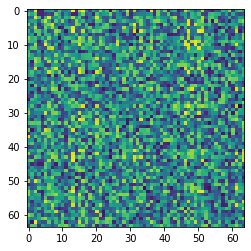

0.021376187


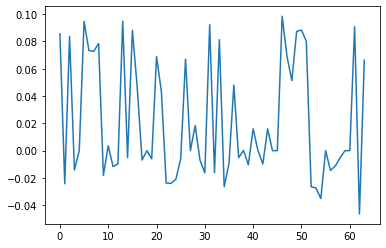

0.13084058


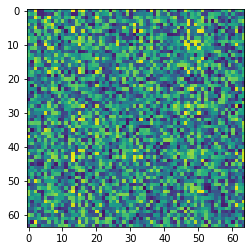

0.021998437


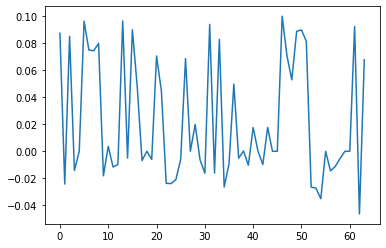

0.13106628


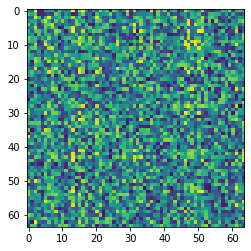

0.022627098


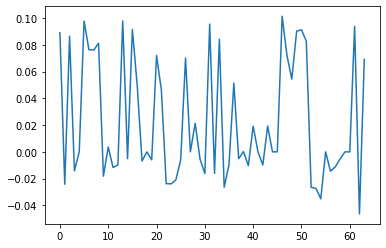

0.13129598


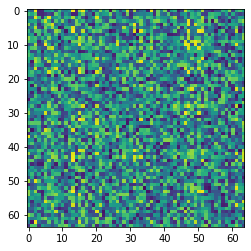

0.02325688


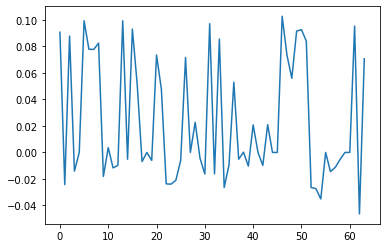

0.13153347


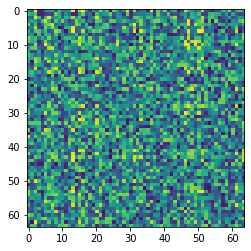

0.023898415


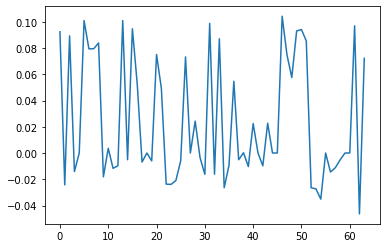

0.1317734


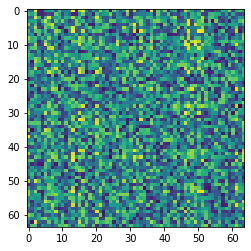

0.024535086


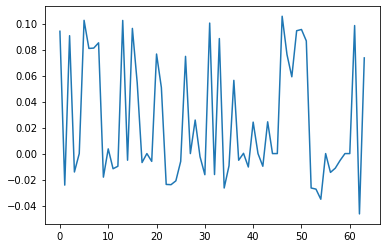

0.13201939


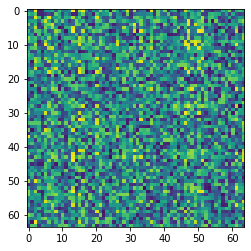

0.025179062


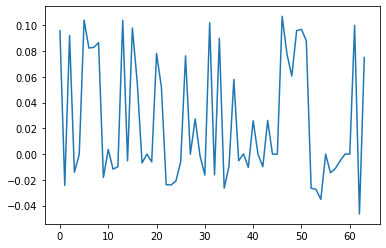

0.13227306


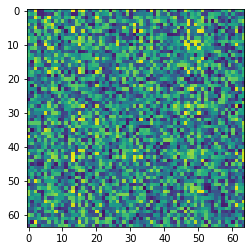

0.025834914


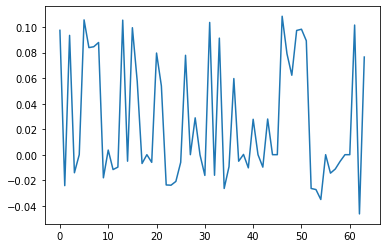

0.13253269


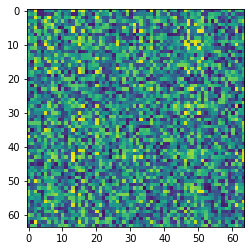

0.026496548


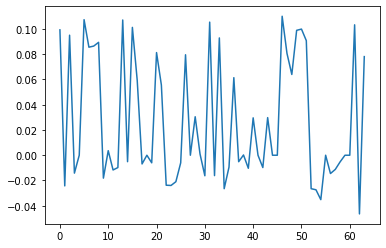

0.13279761


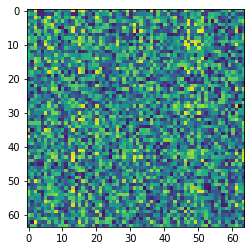

0.027163751


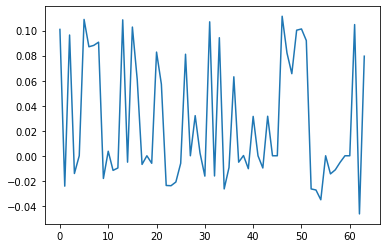

0.1330641


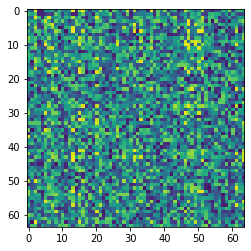

0.027825344


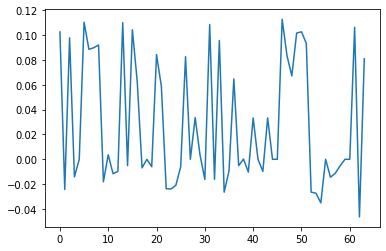

0.13333642


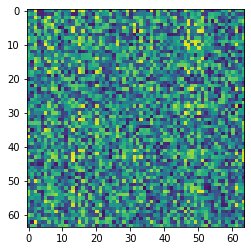

0.0284938


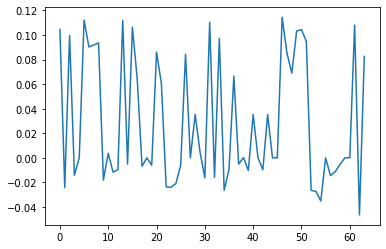

0.13361953


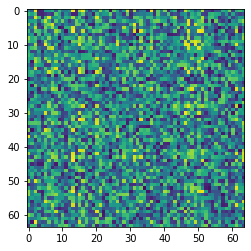

0.029182823


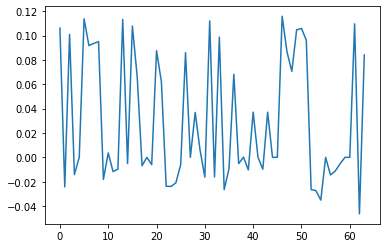

0.13391171


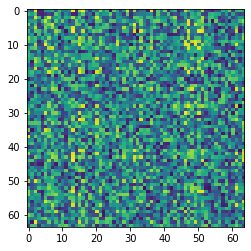

0.029885134


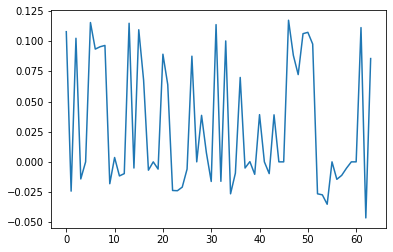

0.1342127


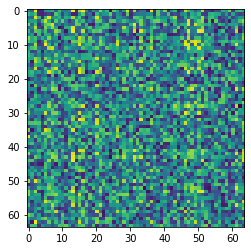

0.030603379


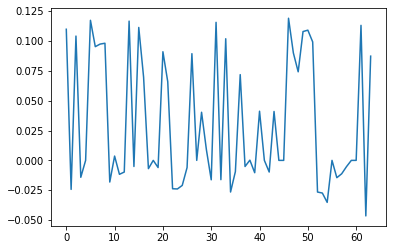

0.13451436


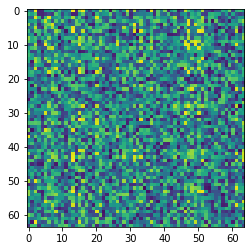

0.03131058


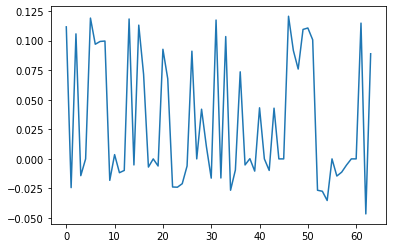

In [39]:
std2 = []
mean2 = []

for layer in layer2:
  if(len(layer.shape) == 2):
    std2.append(np.std(layer))
    print(np.std(layer))
    plt.imshow(layer)
    plt.show()
  else:
    mean2.append(np.mean(layer))
    print(np.mean(layer))
    plt.plot(layer)
    plt.show()

0.14628783


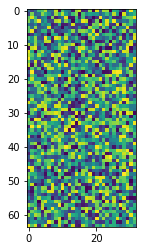

0.0


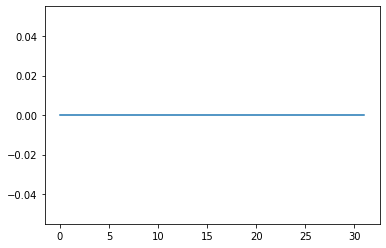

0.14628783


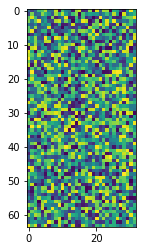

0.0


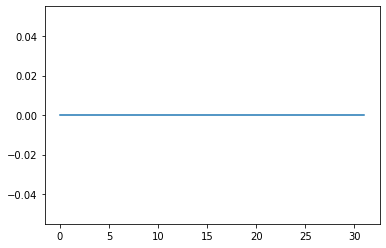

0.14628783


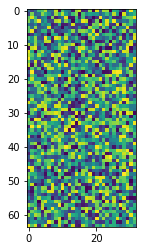

0.0


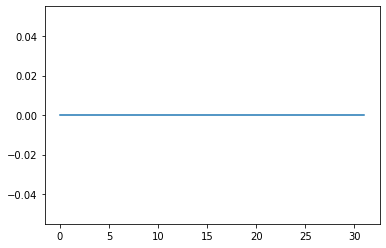

0.14628783


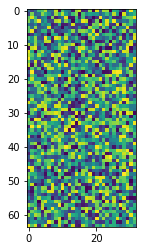

0.0


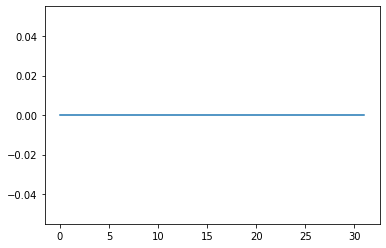

0.14628783


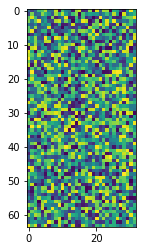

0.0


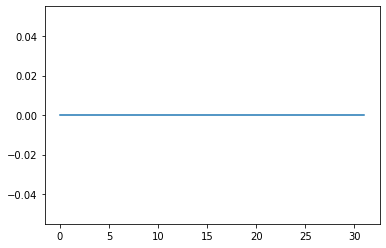

0.1462672


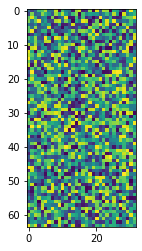

-0.00028125837


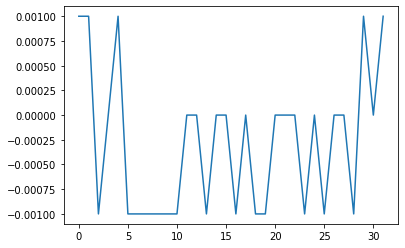

0.14624496


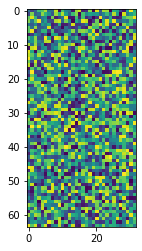

-0.00067761843


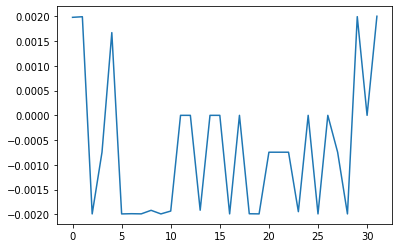

0.14622636


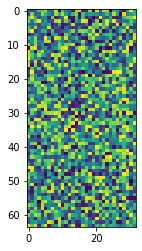

-0.0010373703


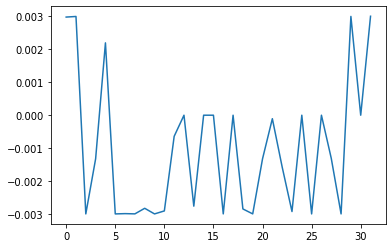

0.14621022


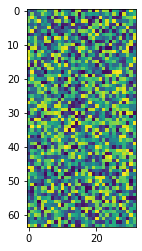

-0.0013564434


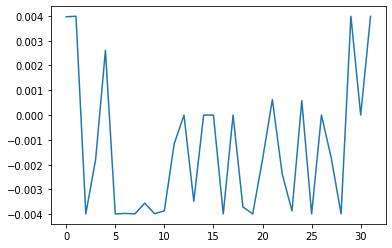

0.146199


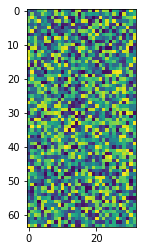

-0.0016221136


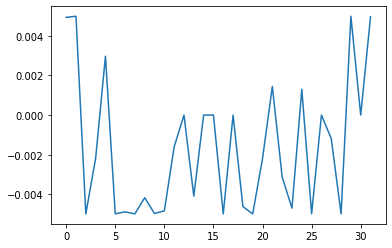

0.14619271


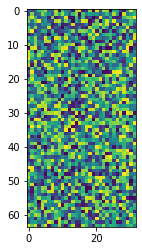

-0.0018597808


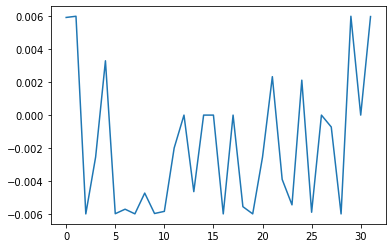

0.14618935


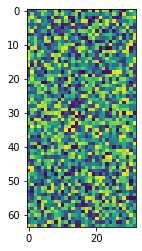

-0.0020689673


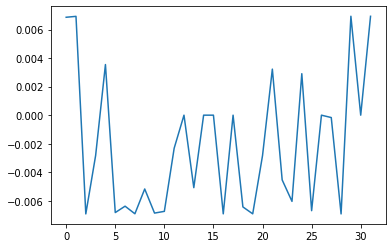

0.14618818


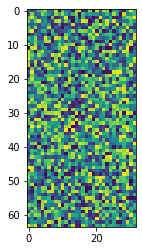

-0.0022909343


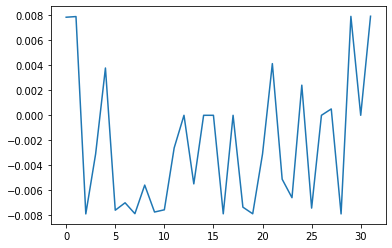

0.14619033


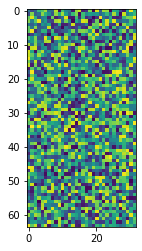

-0.0024918616


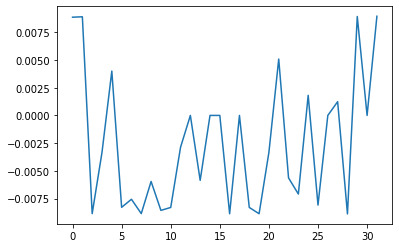

0.14619498


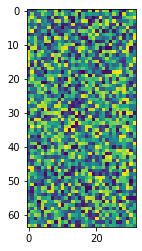

-0.0026712469


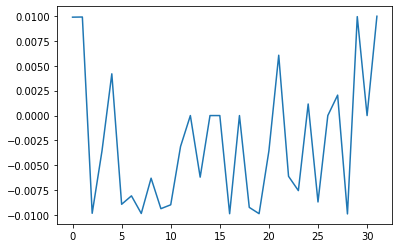

0.1462016


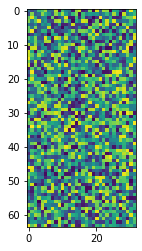

-0.002832002


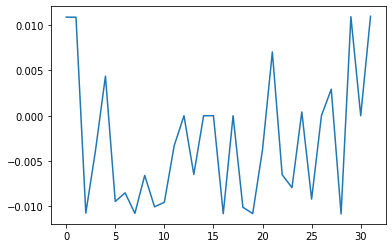

0.14621037


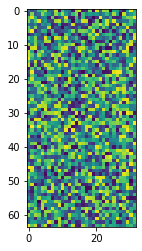

-0.0029753398


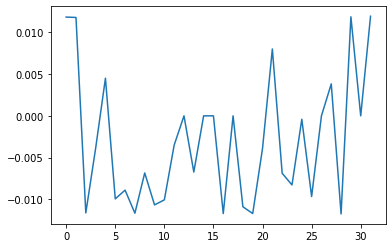

0.14622109


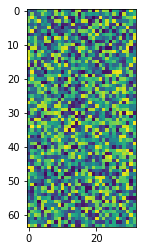

-0.0031046


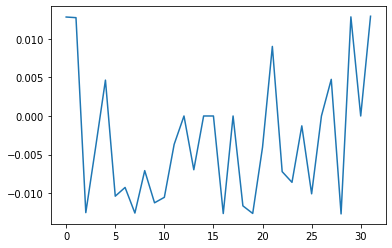

0.14623441


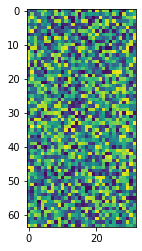

-0.00322139


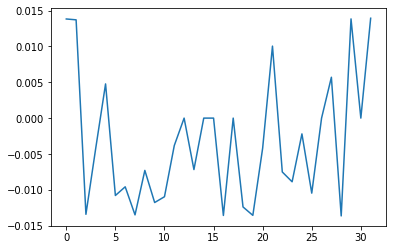

0.14625117


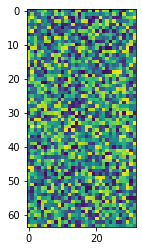

-0.0033171275


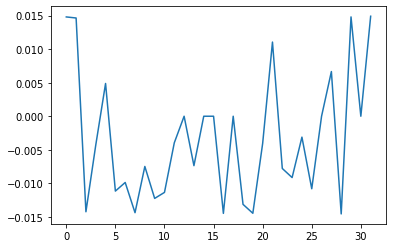

0.14627059


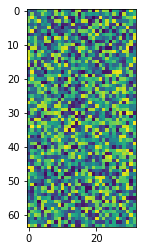

-0.0033957139


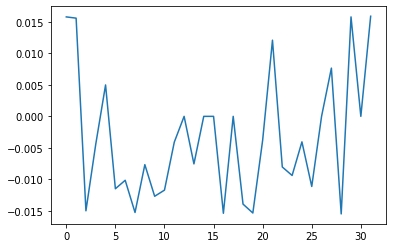

0.14629151


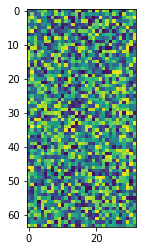

-0.0034553932


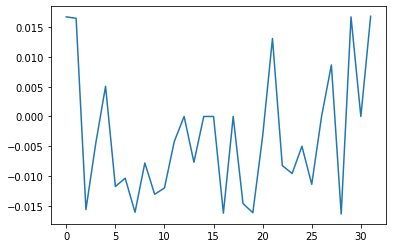

0.14631532


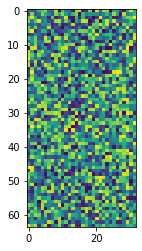

-0.0034977142


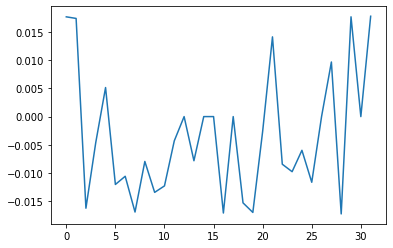

0.14634146


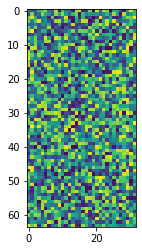

-0.0035282273


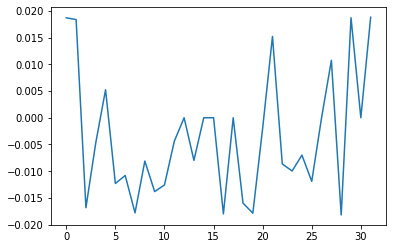

0.14636962


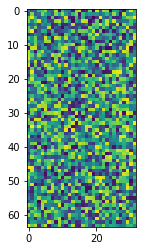

-0.0035451273


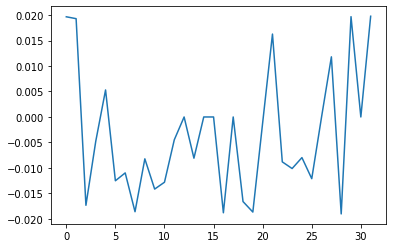

0.14640032


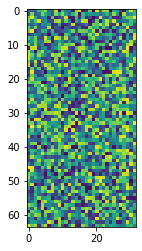

-0.0035478943


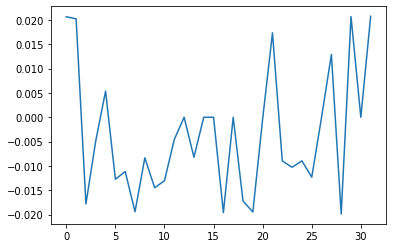

0.14643537


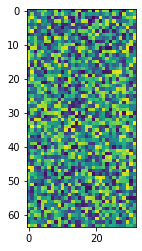

-0.0035263365


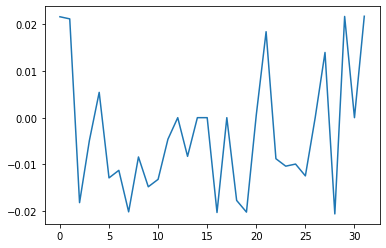

0.14647232


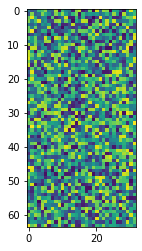

-0.0034817953


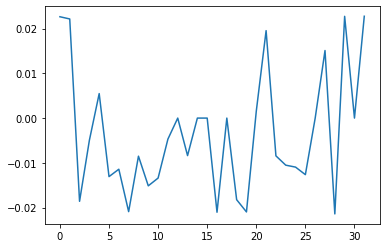

0.14651132


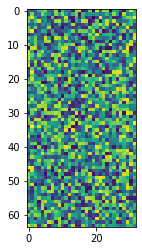

-0.0034183338


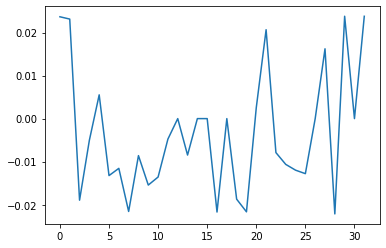

0.14655156


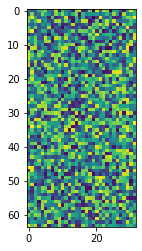

-0.0033373688


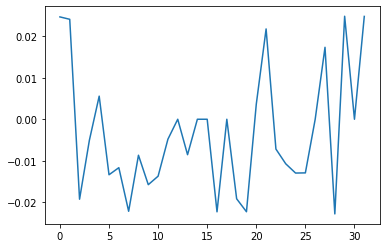

0.1465918


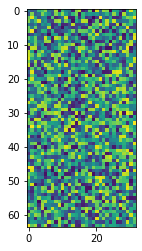

-0.0032491384


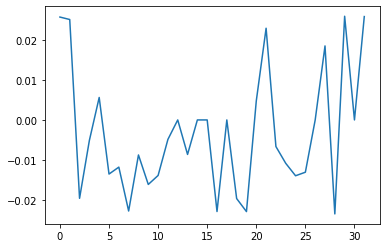

0.14663374


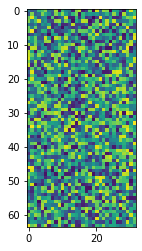

-0.0031431573


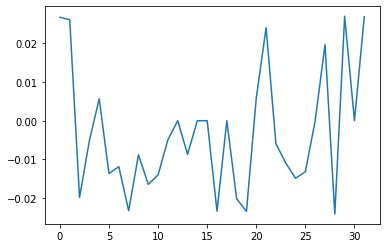

0.1466776


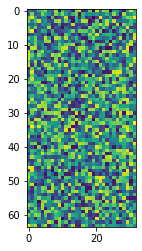

-0.0030266927


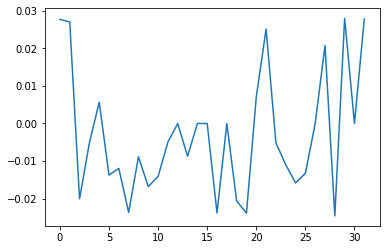

0.14672239


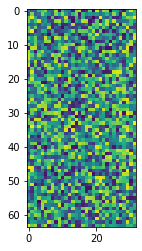

-0.0028961487


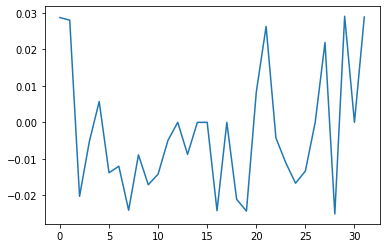

0.14676921


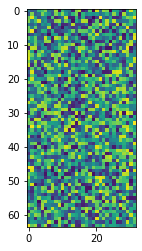

-0.0027485641


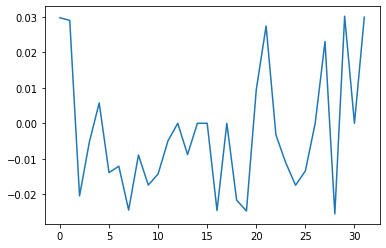

0.14681582


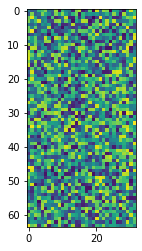

-0.0025928773


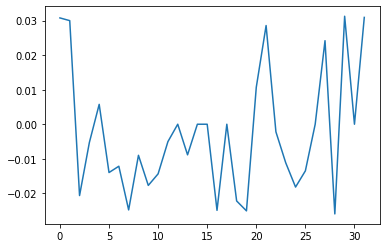

0.14686315


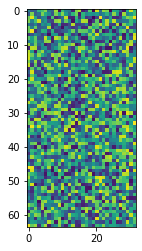

-0.0024286646


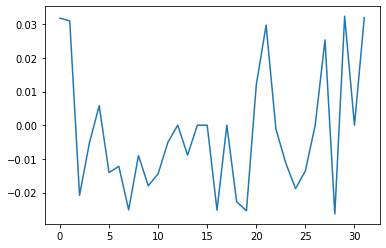

0.14691226


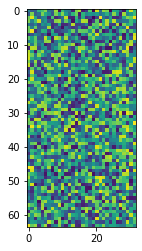

-0.002249952


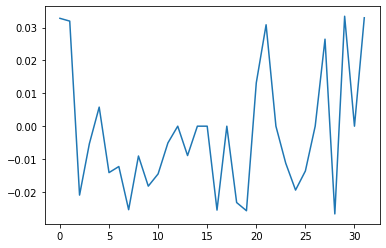

0.14696352


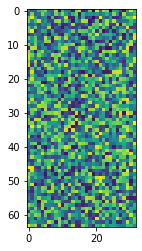

-0.0020542918


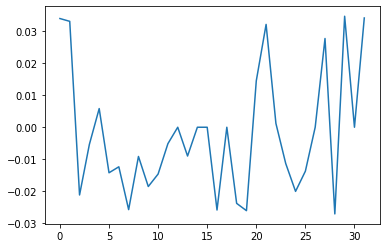

0.14701611


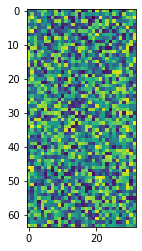

-0.0018519837


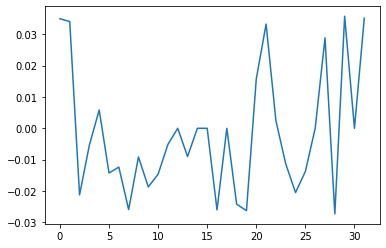

0.14706898


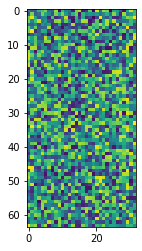

-0.0016494431


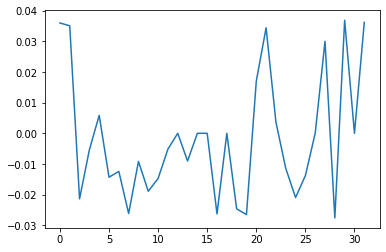

0.14712402


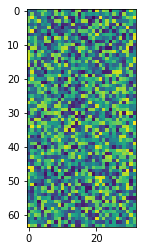

-0.0014377764


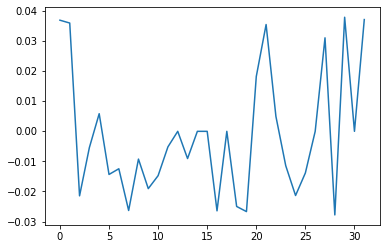

0.14718041


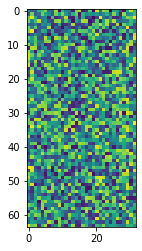

-0.0012215524


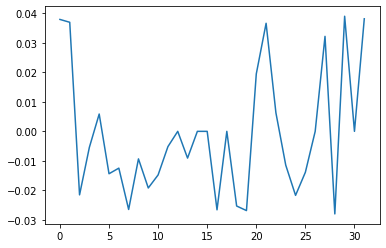

0.14723976


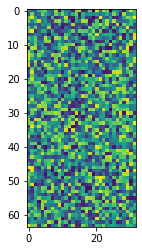

-0.0009969972


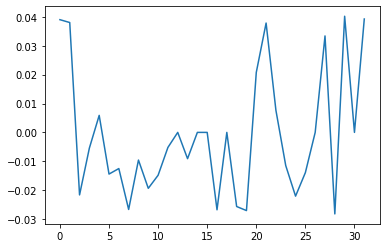

0.14730148


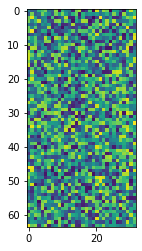

-0.0007639205


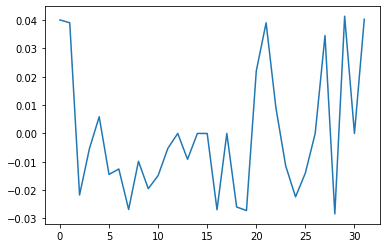

0.14736438


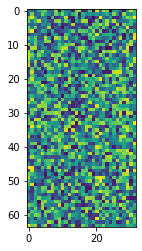

-0.00052954606


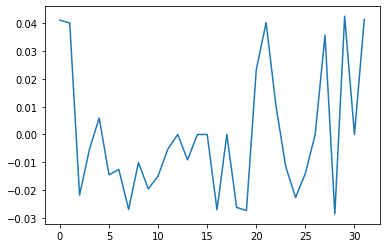

0.14742996


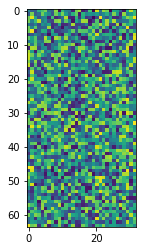

-0.00028425478


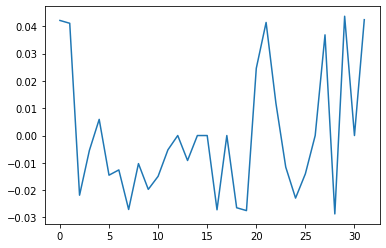

0.14749824


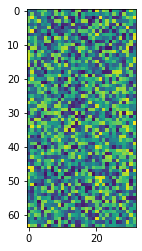

-2.6368769e-05


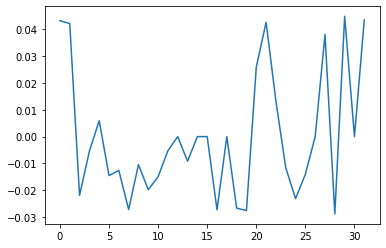

0.14756867


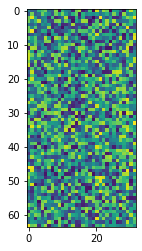

0.00023782882


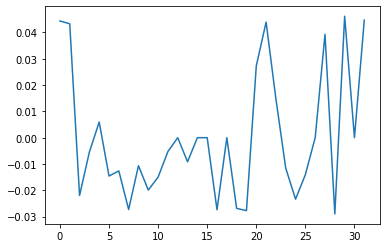

0.14764152


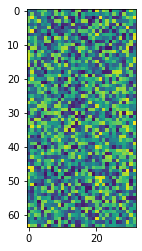

0.0005093976


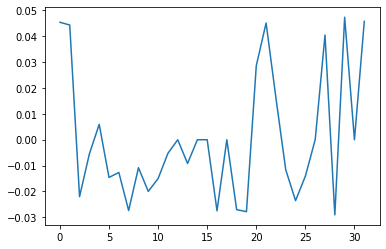

0.14771575


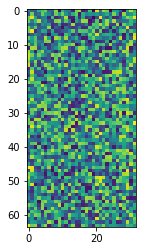

0.00077997916


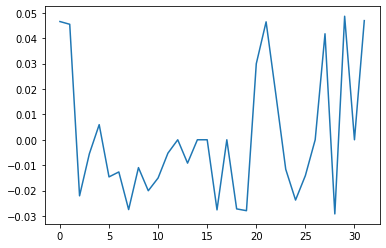

0.14779077


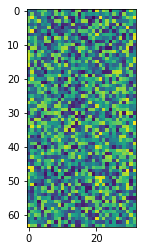

0.0010476538


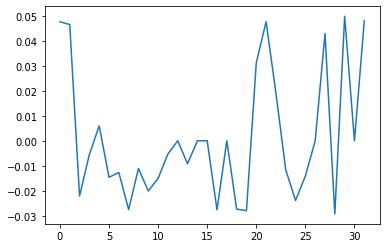

0.14786763


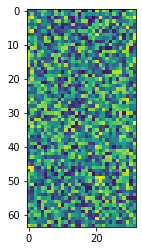

0.0013173047


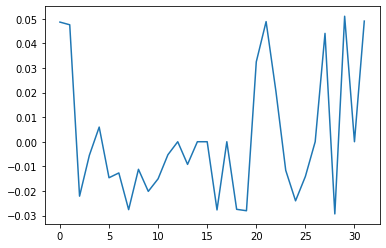

0.14794725


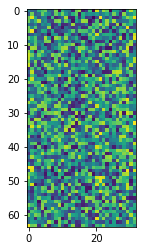

0.0015946975


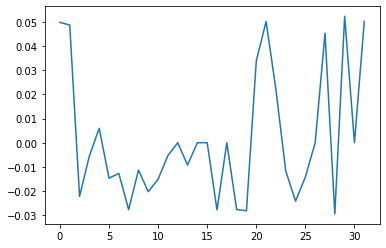

0.14802976


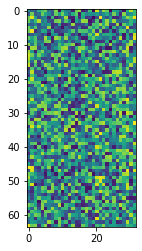

0.0018789193


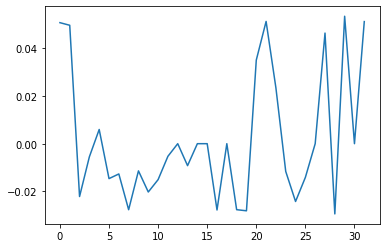

0.14811355


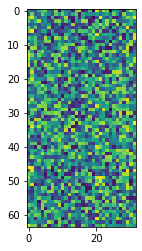

0.002163325


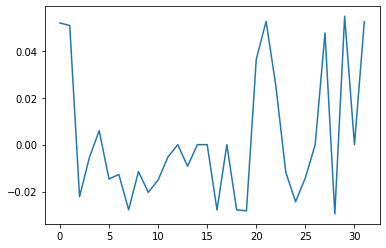

0.14819826


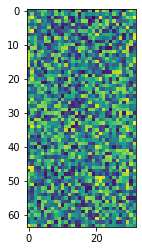

0.0024435695


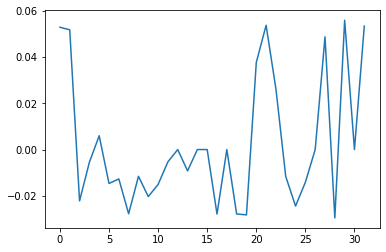

0.14828509


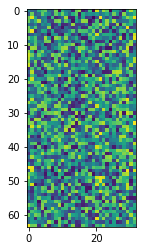

0.0027248105


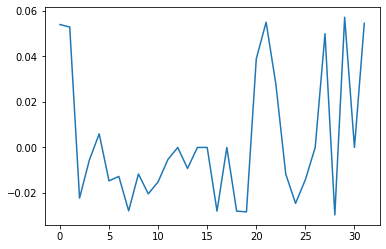

0.14837463


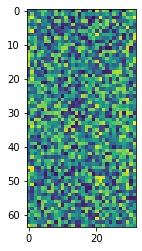

0.00300922


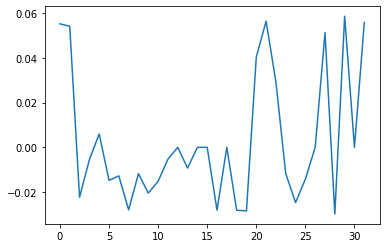

0.14846638


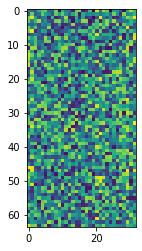

0.0032965376


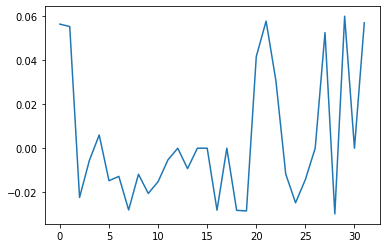

0.1485611


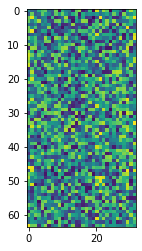

0.0035905836


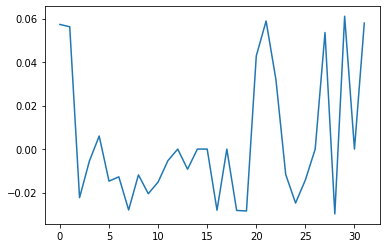

0.14865768


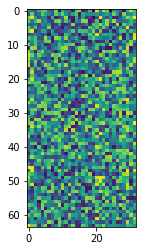

0.00388434


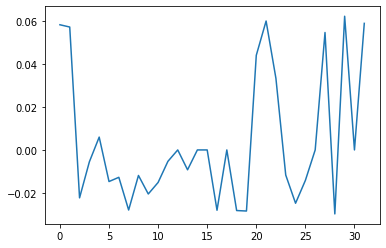

0.14875649


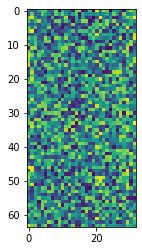

0.004177967


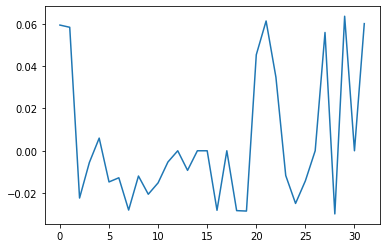

0.14885439


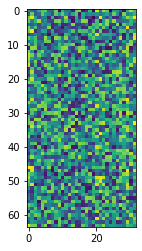

0.004461831


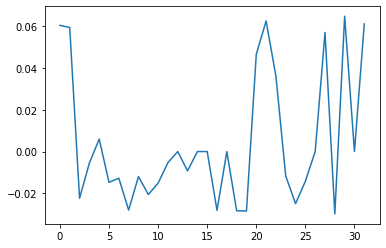

0.1489564


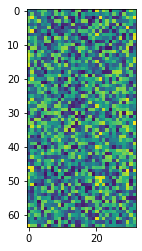

0.0047535826


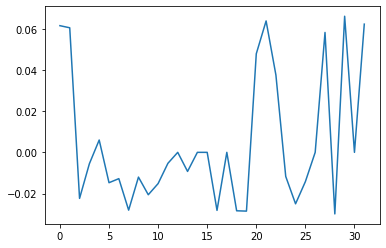

0.14906226


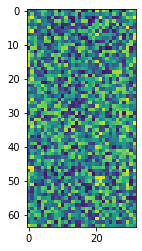

0.005057946


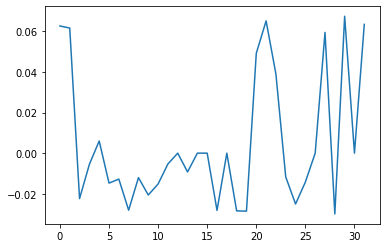

0.14916718


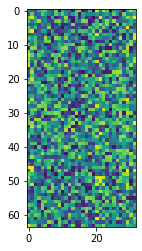

0.0053819017


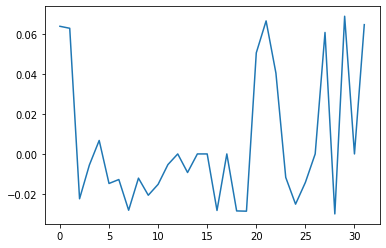

0.14927574


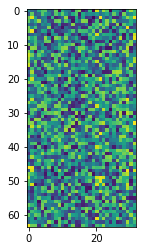

0.005726453


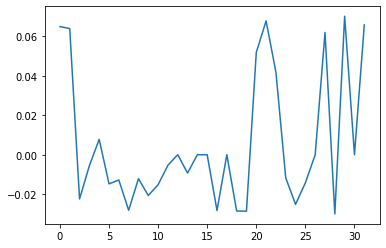

0.1493874


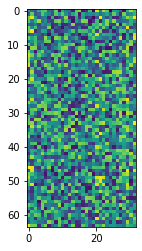

0.006080697


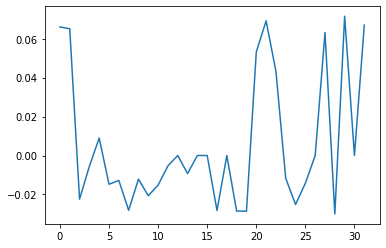

0.14949994


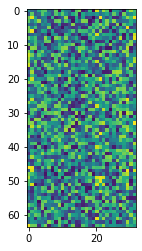

0.0064344127


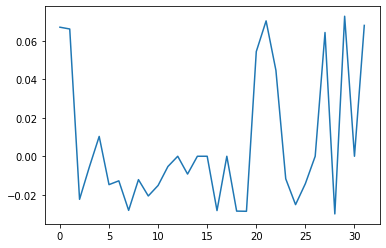

0.14961511


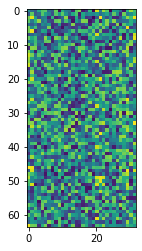

0.006794061


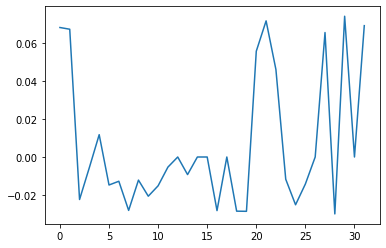

0.14973123


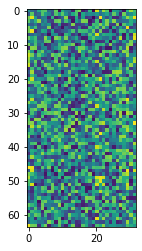

0.007151524


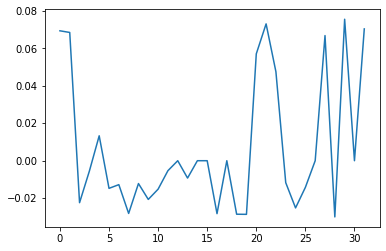

0.14984843


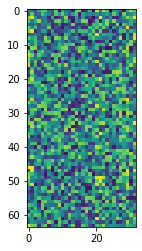

0.0075069037


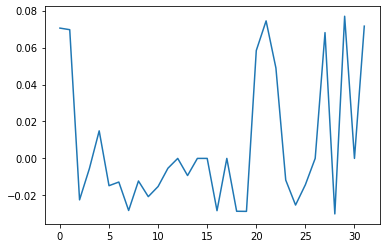

0.14996722


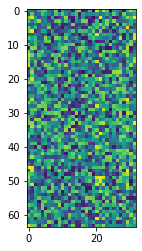

0.007860359


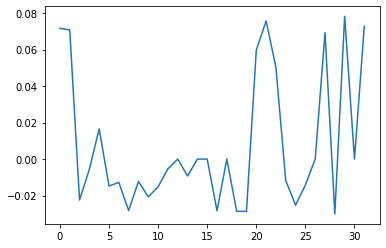

0.1500899


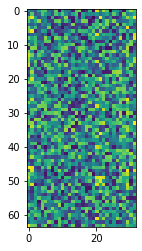

0.008219713


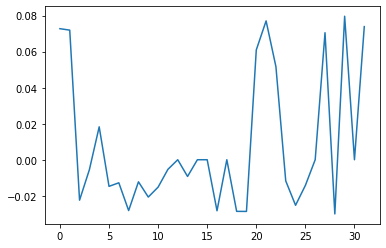

0.15021236


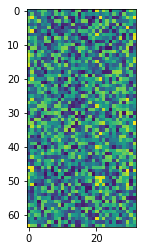

0.00857057


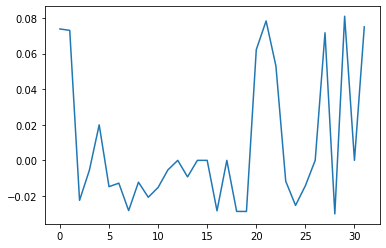

0.15033974


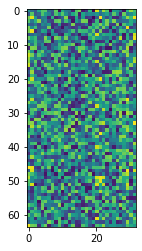

0.008930145


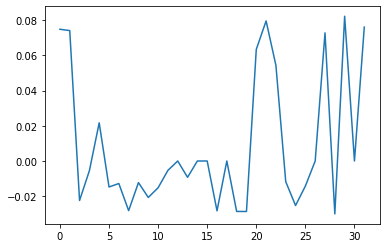

0.15047087


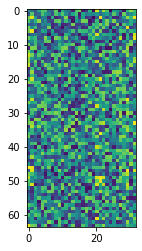

0.009292358


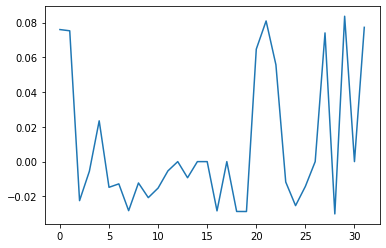

0.15060346


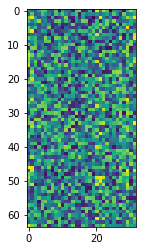

0.009651438


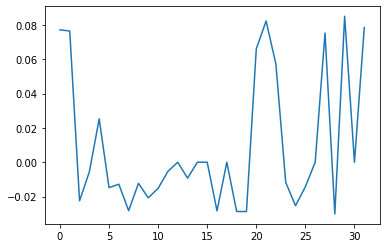

0.1507401


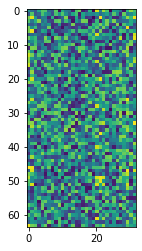

0.010015904


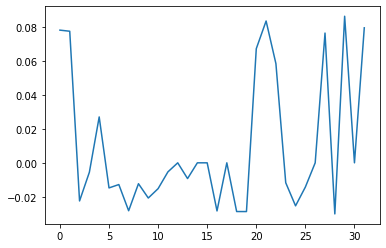

0.15087534


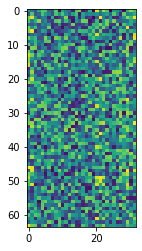

0.010367756


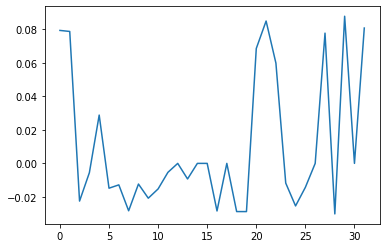

0.15101124


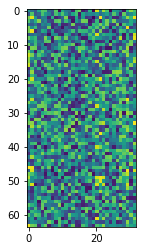

0.010711663


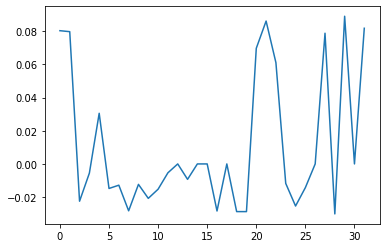

0.15115303


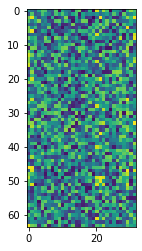

0.0110658575


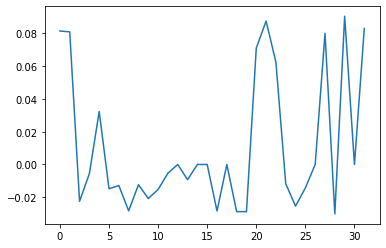

0.15129302


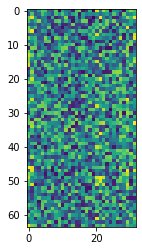

0.011408556


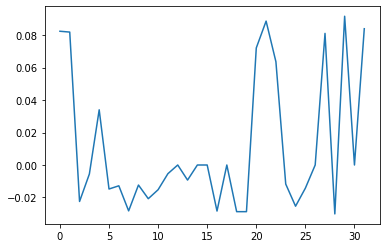

0.15143894


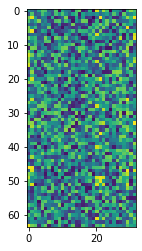

0.011759257


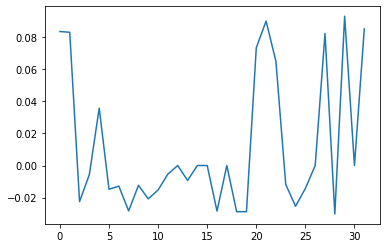

0.15159014


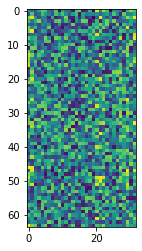

0.012116975


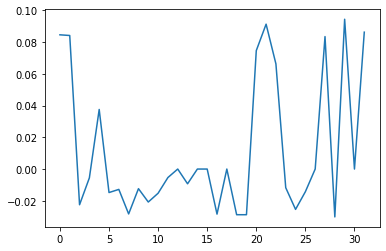

0.15174499


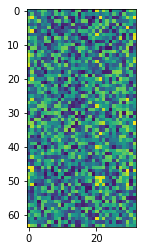

0.012475264


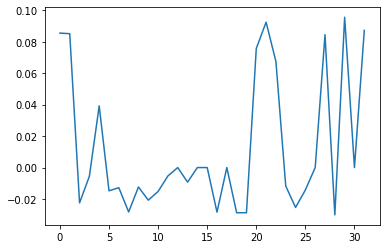

0.15190217


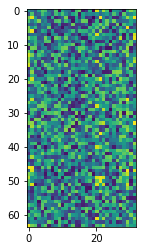

0.012831167


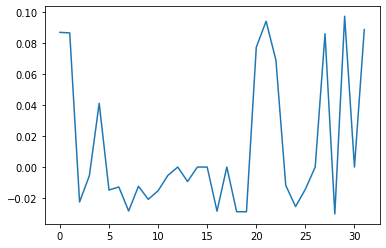

0.15206398


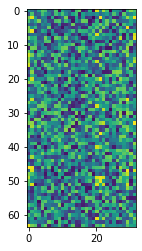

0.013190947


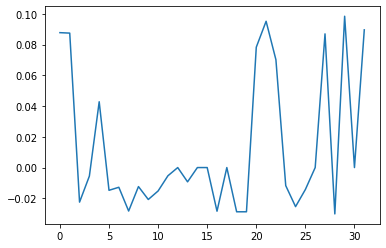

0.15222698


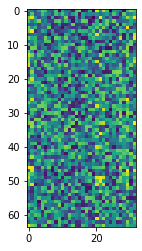

0.013545194


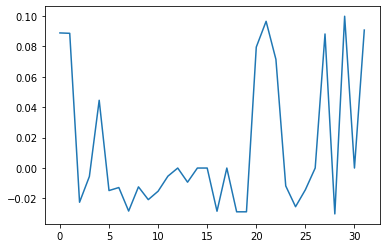

0.15239348


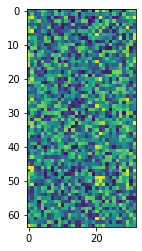

0.01390081


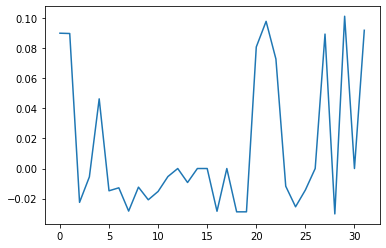

0.15256448


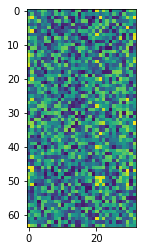

0.014260677


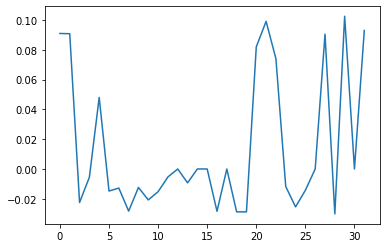

0.15273884


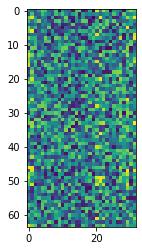

0.014621396


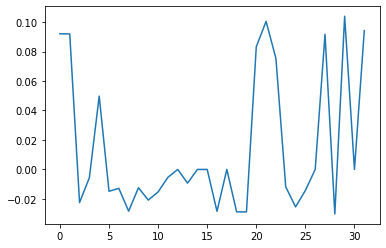

0.15291622


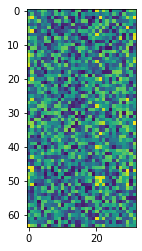

0.014982961


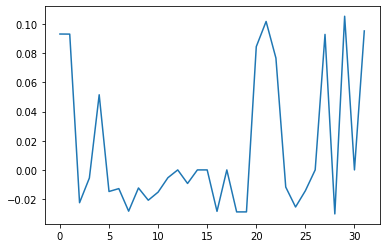

0.15309425


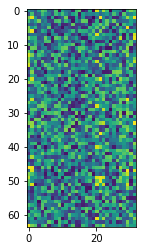

0.015339111


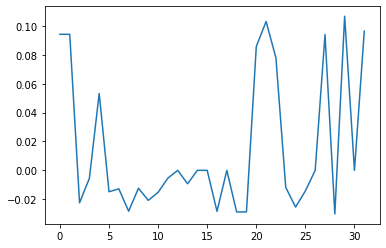

0.15327565


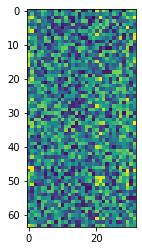

0.015696881


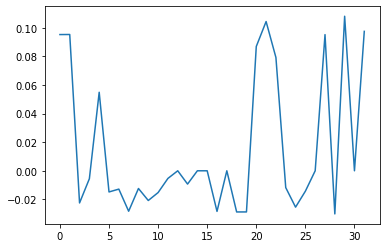

0.15346342


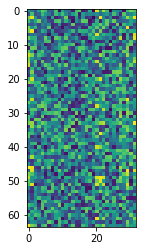

0.016064953


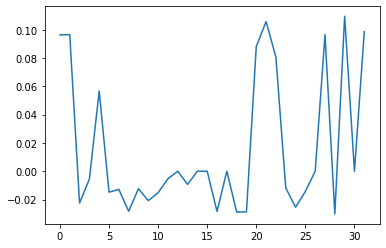

0.15365651


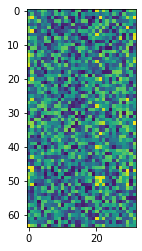

0.01643921


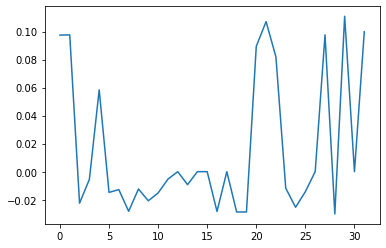

0.15385443


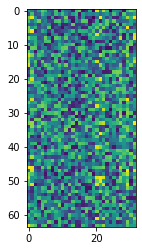

0.016821727


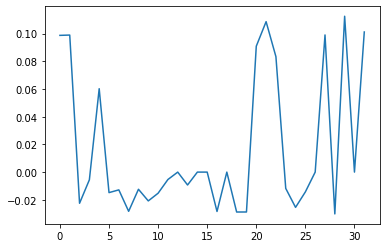

0.1540522


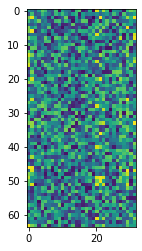

0.017196555


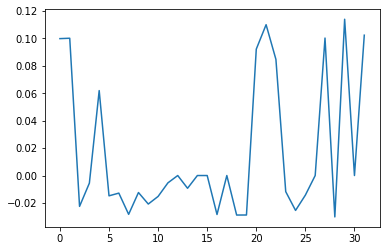

In [40]:
std3 = []
mean3 = []

for layer in layer3:
  if(len(layer.shape) == 2):
    std3.append(np.std(layer))
    print(np.std(layer))
    plt.imshow(layer)
    plt.show()
  else:
    mean3.append(np.mean(layer))
    print(np.mean(layer))
    plt.plot(layer)
    plt.show()

0.21549836


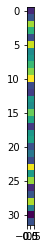

0.0


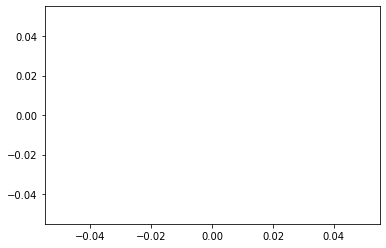

0.21549836


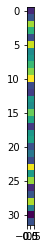

0.0


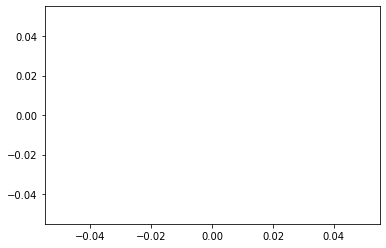

0.21549836


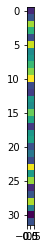

0.0


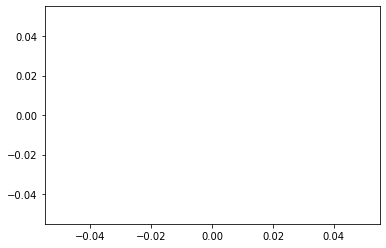

0.21549836


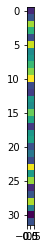

0.0


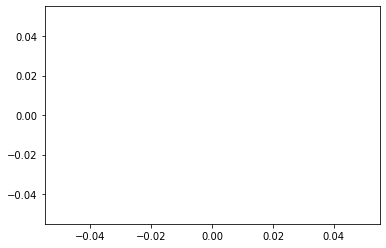

0.21549836


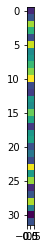

0.0


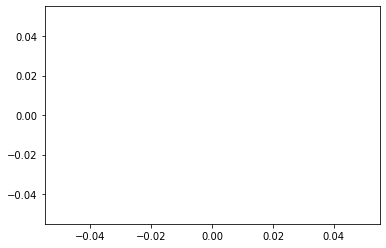

0.21526147


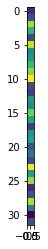

-0.0010000298


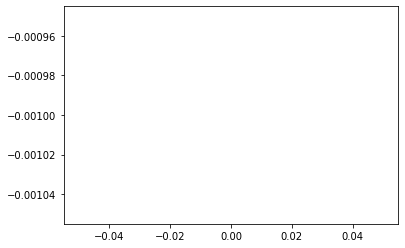

0.21499948


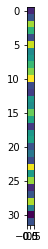

-0.0019898904


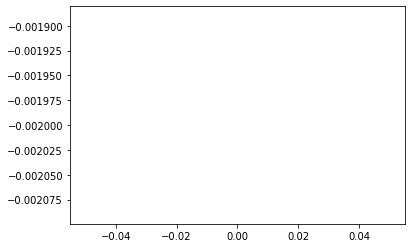

0.21472357


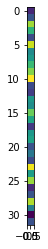

-0.002985625


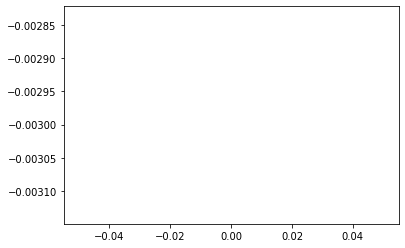

0.21446867


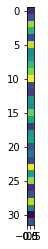

-0.0039861915


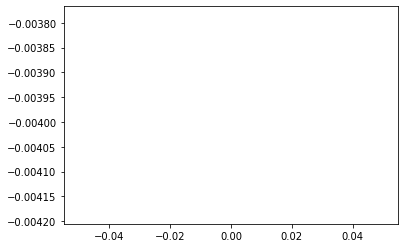

0.21422985


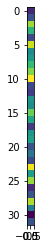

-0.0049925307


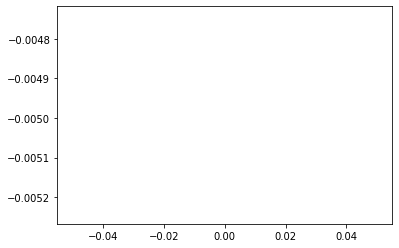

0.21402267


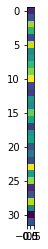

-0.005967113


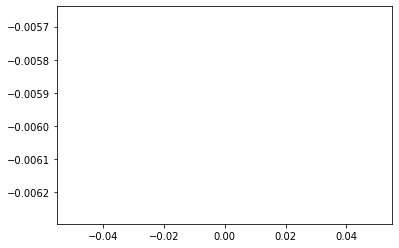

0.21385098


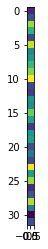

-0.006927361


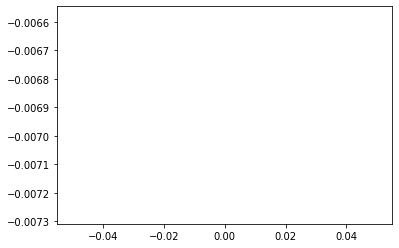

0.21370086


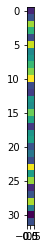

-0.007902244


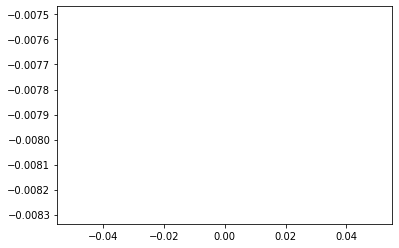

0.21356873


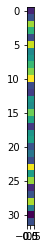

-0.008887996


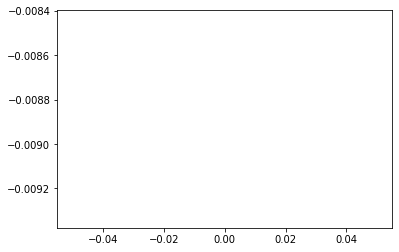

0.21346024


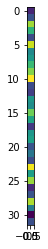

-0.009874026


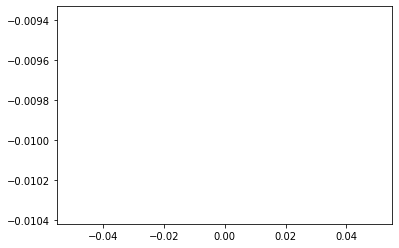

0.21337351


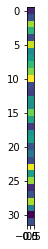

-0.010828901


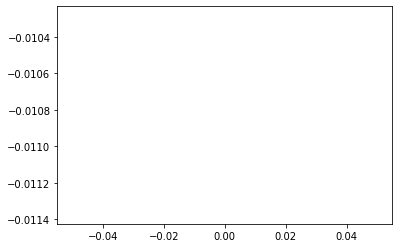

0.21330716


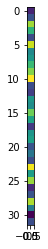

-0.0117580835


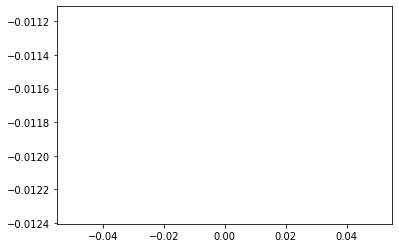

0.21325494


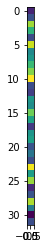

-0.012703346


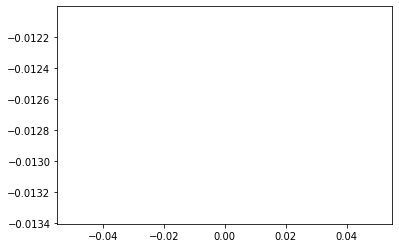

0.2132187


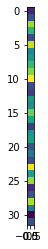

-0.013661734


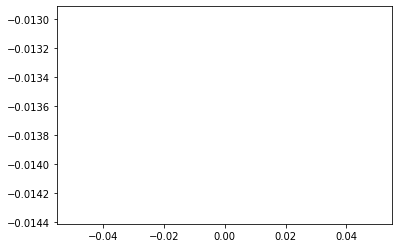

0.21320377


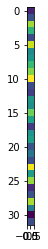

-0.014586542


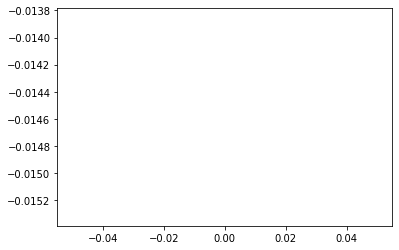

0.21321225


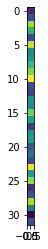

-0.015511382


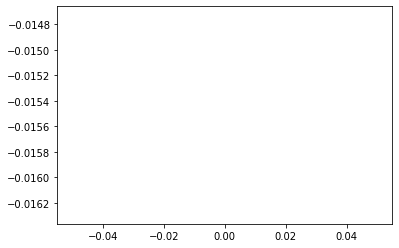

0.21323636


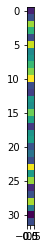

-0.016429946


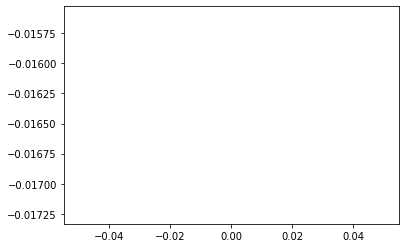

0.21327886


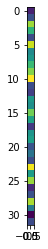

-0.017336305


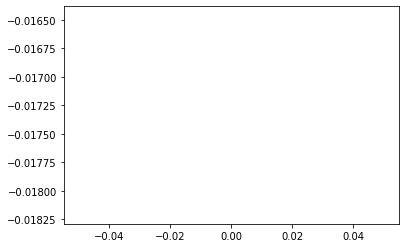

0.21333121


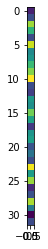

-0.018258289


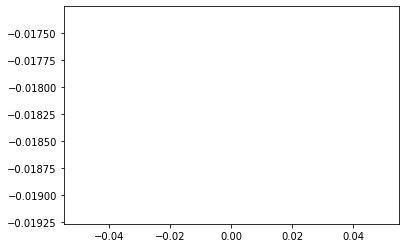

0.21339805


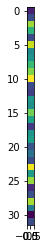

-0.019160353


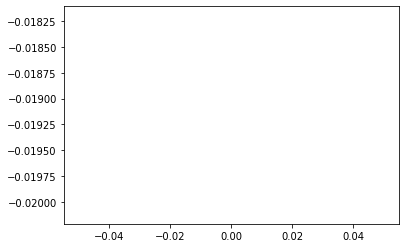

0.21347813


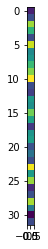

-0.02007313


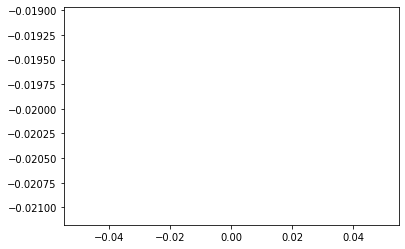

0.21357498


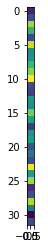

-0.021001346


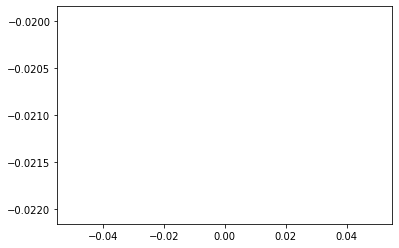

0.21369126


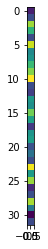

-0.021948585


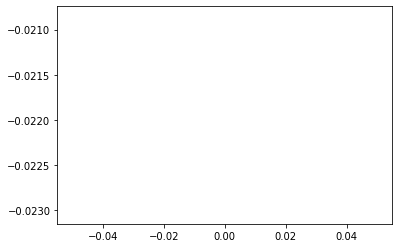

0.21382737


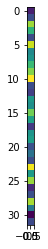

-0.022887357


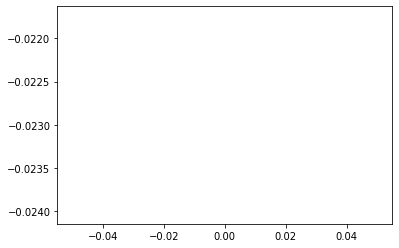

0.2139741


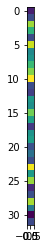

-0.023818843


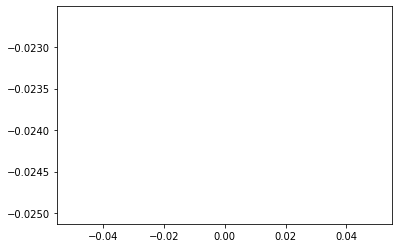

0.21412593


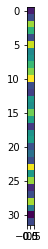

-0.024757527


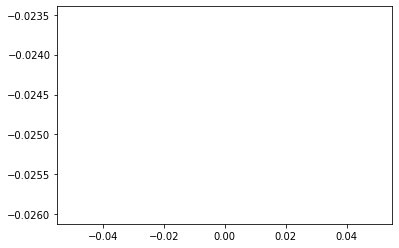

0.2142905


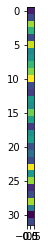

-0.025714798


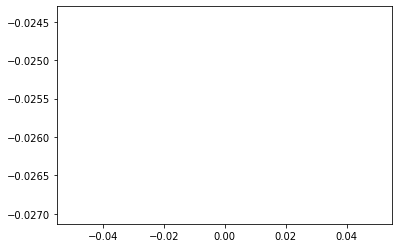

0.21446586


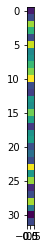

-0.02666251


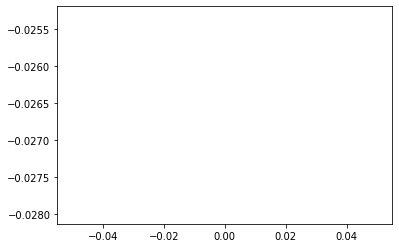

0.21465054


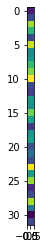

-0.027601898


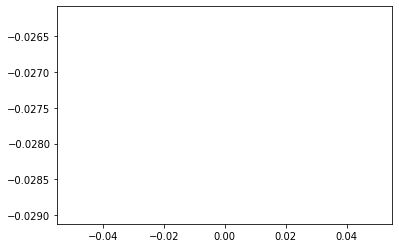

0.2148462


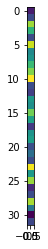

-0.028566292


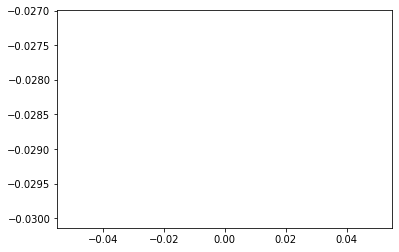

0.21505162


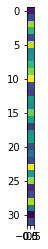

-0.029512923


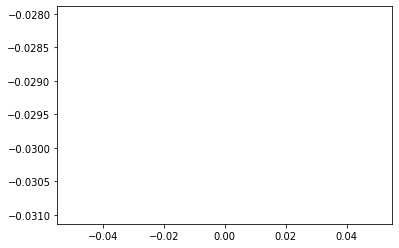

0.21526684


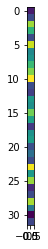

-0.03044385


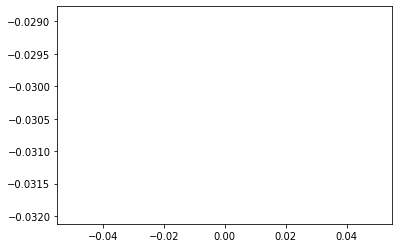

0.21548872


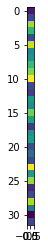

-0.031395525


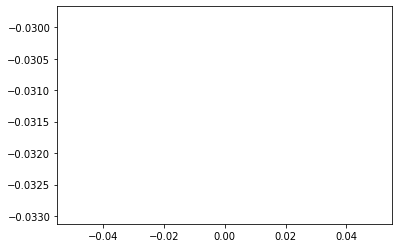

0.21572158


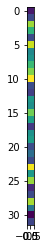

-0.032377176


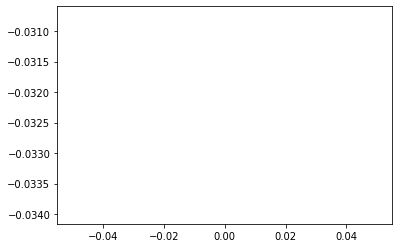

0.21596211


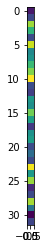

-0.033346


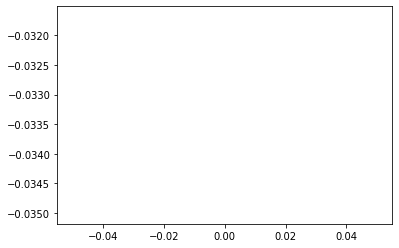

0.21620508


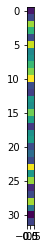

-0.034280542


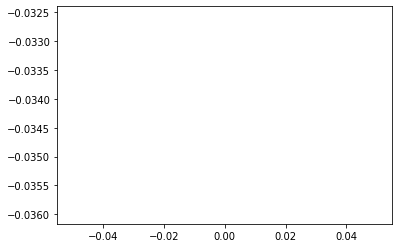

0.21645604


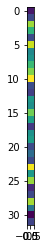

-0.035222065


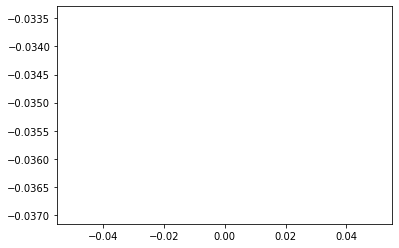

0.21671352


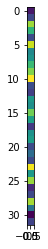

-0.036155425


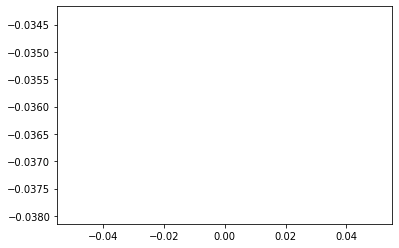

0.21697894


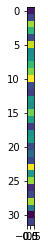

-0.037109815


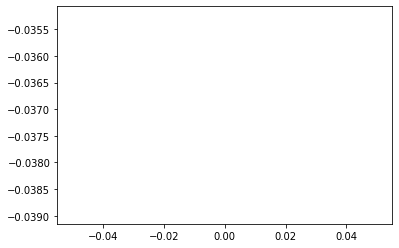

0.21725386


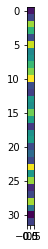

-0.038075946


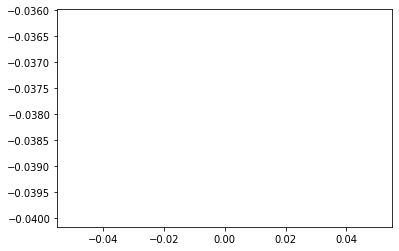

0.21753313


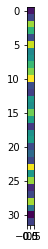

-0.039023455


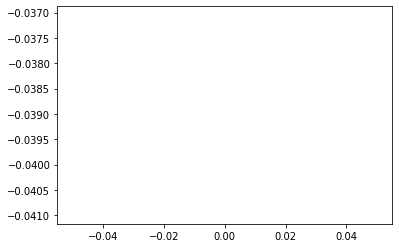

0.21782129


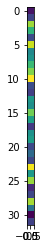

-0.039990563


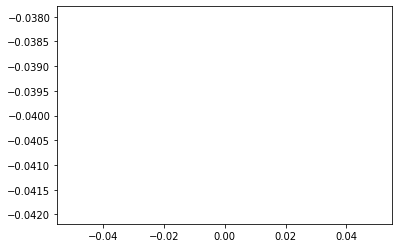

0.21811807


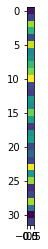

-0.040987737


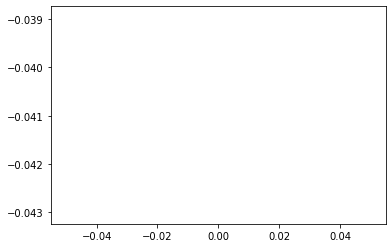

0.21842174


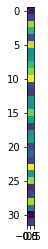

-0.041991424


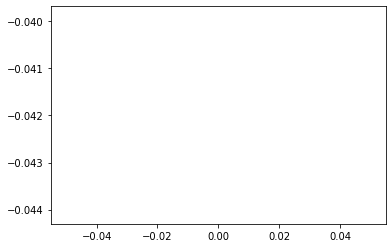

0.21873294


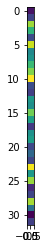

-0.04300756


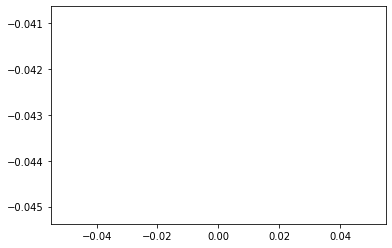

0.21904758


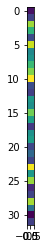

-0.044006404


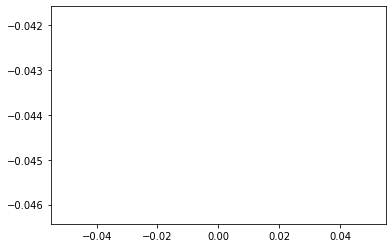

0.21936369


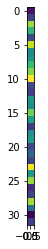

-0.04498222


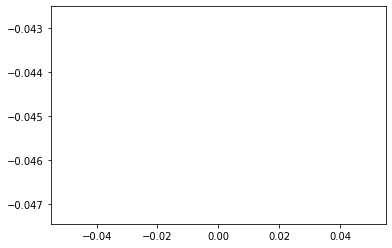

0.2196856


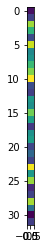

-0.04595268


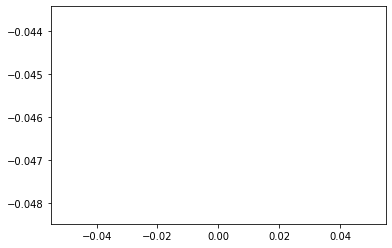

0.22001623


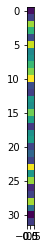

-0.04693996


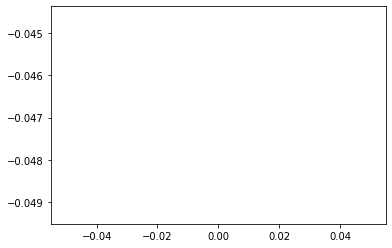

0.22035502


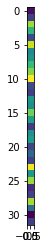

-0.047942013


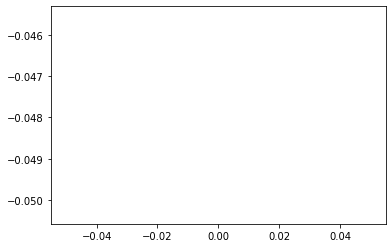

0.22069706


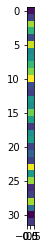

-0.04893558


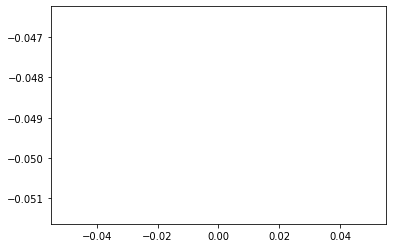

0.2210396


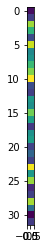

-0.04990631


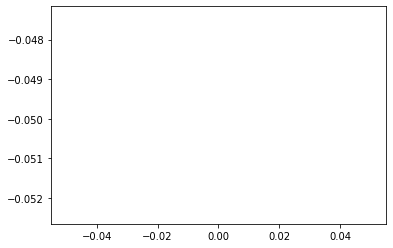

0.22138815


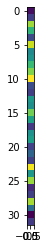

-0.05087209


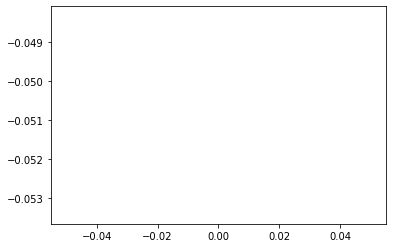

0.22174364


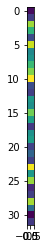

-0.051841035


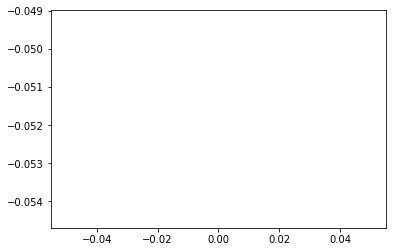

0.22210525


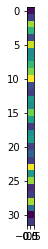

-0.052812826


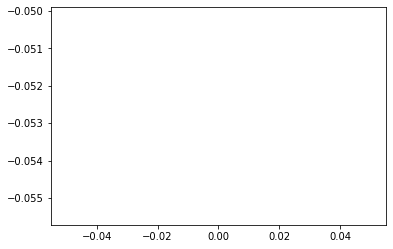

0.22247452


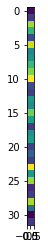

-0.053801782


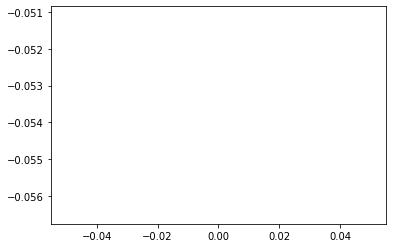

0.22284776


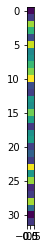

-0.054783758


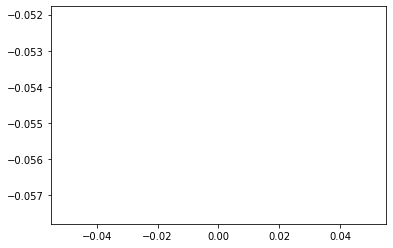

0.2232248


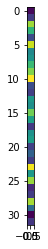

-0.05575954


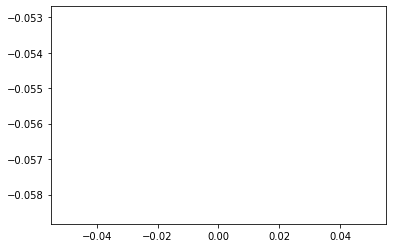

0.22359572


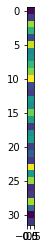

-0.0566978


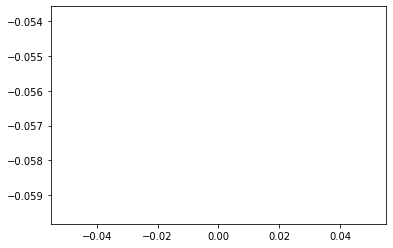

0.22397667


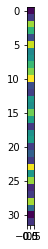

-0.057657458


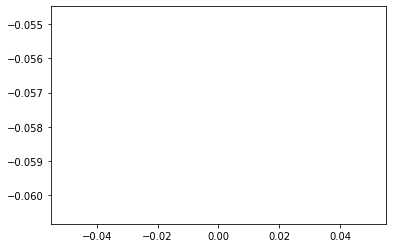

0.22436759


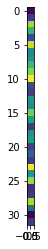

-0.05865723


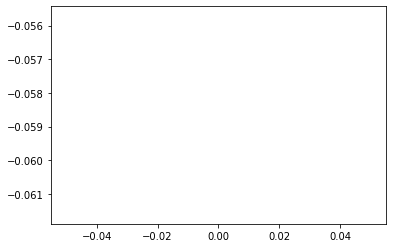

0.2247683


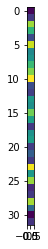

-0.05964081


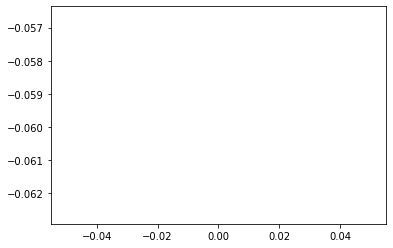

0.22519124


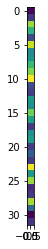

-0.06066148


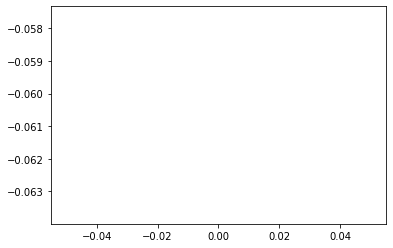

0.22562614


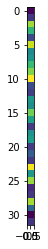

-0.061693475


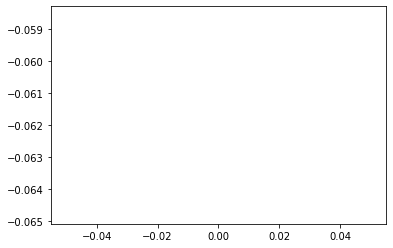

0.22606364


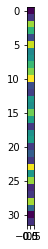

-0.0627054


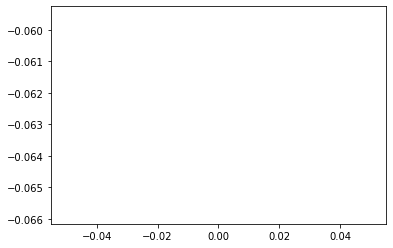

0.22650895


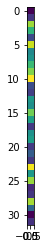

-0.06372228


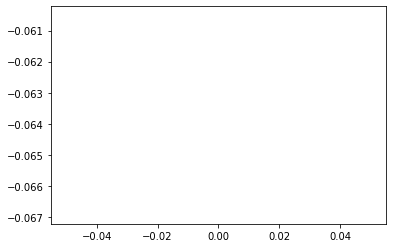

0.22695789


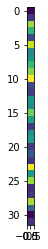

-0.06472061


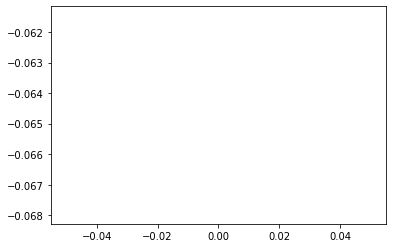

0.22740984


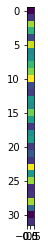

-0.06570234


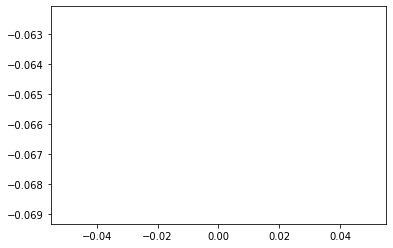

0.22786562


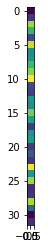

-0.06666926


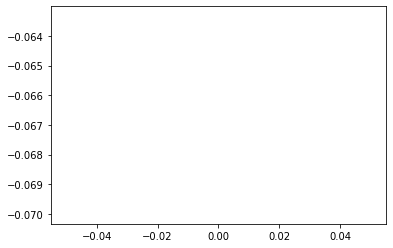

0.22833034


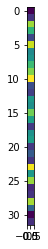

-0.06764638


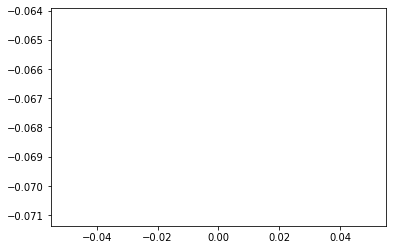

0.22879133


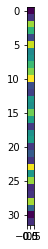

-0.068592906


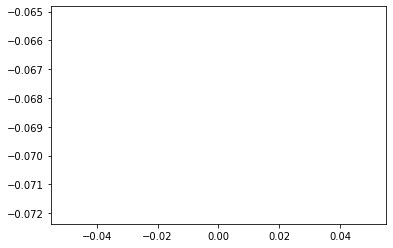

0.22926368


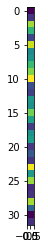

-0.069559634


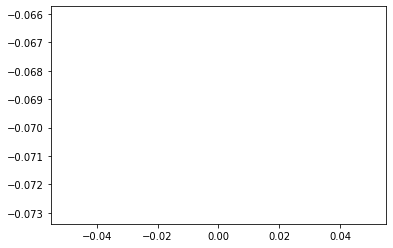

0.22974545


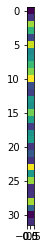

-0.07052893


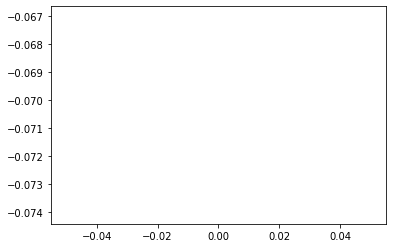

0.23022819


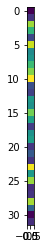

-0.07148471


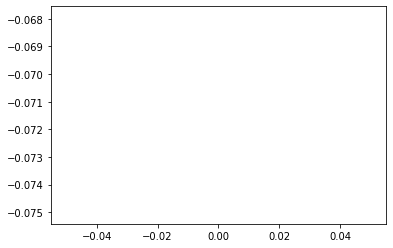

0.23071997


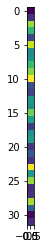

-0.07245215


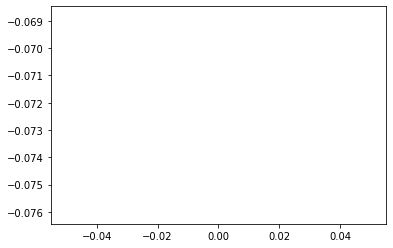

0.23120293


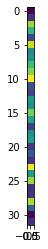

-0.073381476


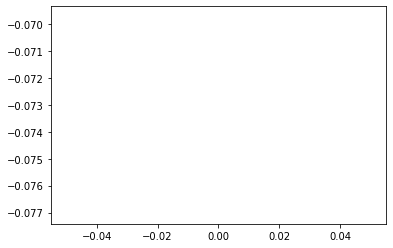

0.23168464


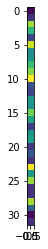

-0.07428498


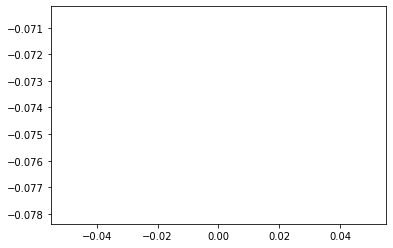

0.23218016


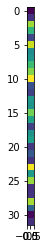

-0.07521401


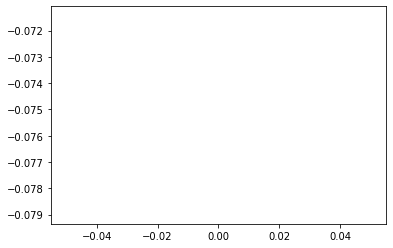

0.23266557


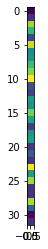

-0.07610877


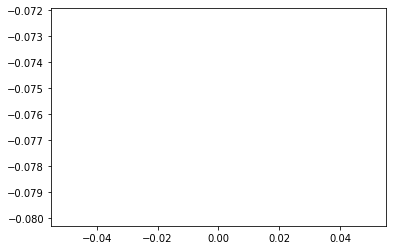

0.23316541


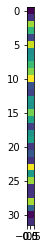

-0.077022344


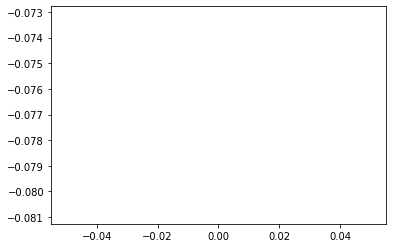

0.2336777


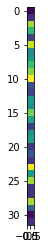

-0.07795273


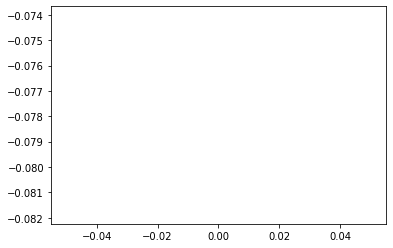

0.23419717


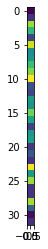

-0.078882076


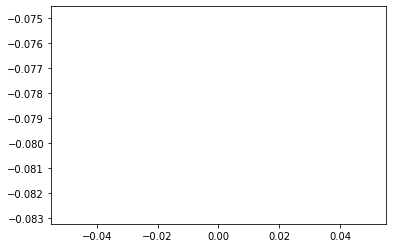

0.23471957


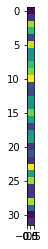

-0.079802364


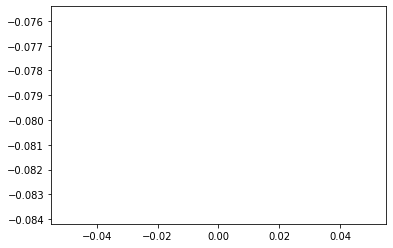

0.23525174


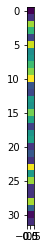

-0.08073099


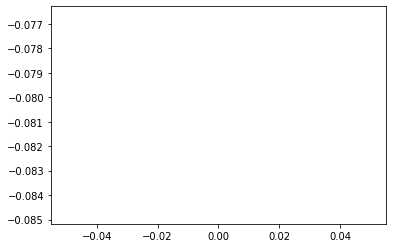

0.23578312


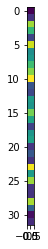

-0.08164238


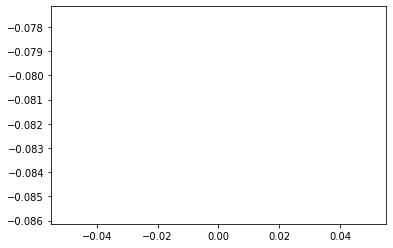

0.2363209


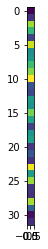

-0.08255507


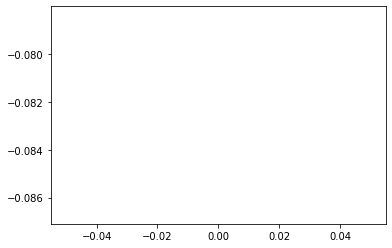

0.23686773


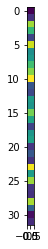

-0.08347719


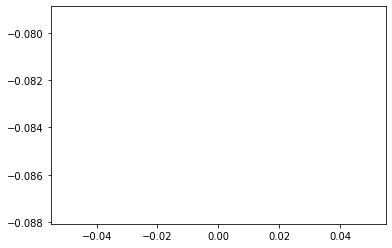

0.23742005


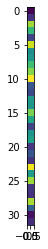

-0.0843996


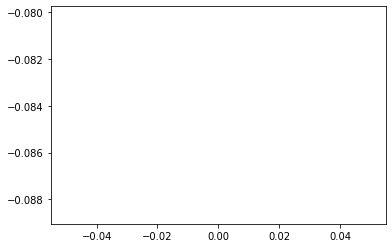

0.23797709


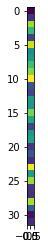

-0.08532234


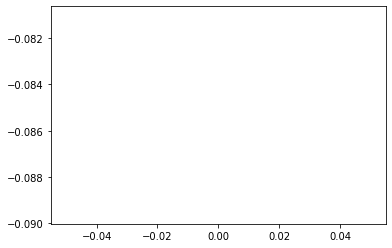

0.23853162


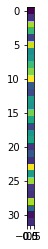

-0.08622867


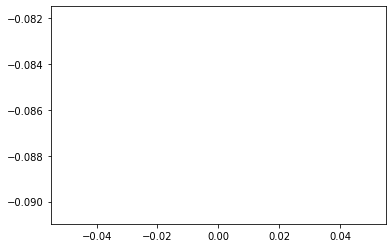

0.23909183


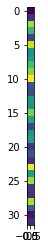

-0.08713719


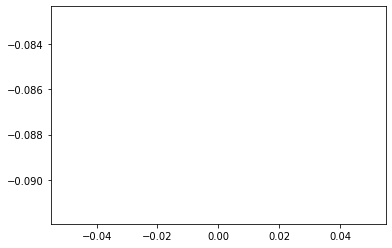

0.23966531


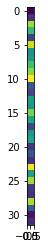

-0.08807232


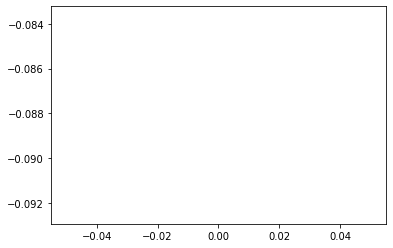

0.24024935


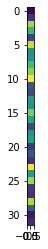

-0.08902305


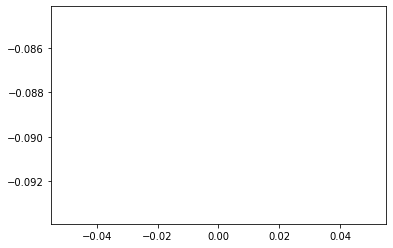

0.2408431


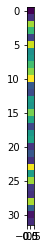

-0.089995734


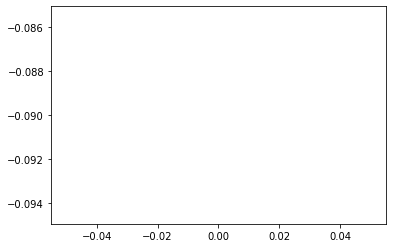

0.24143225


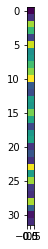

-0.09094683


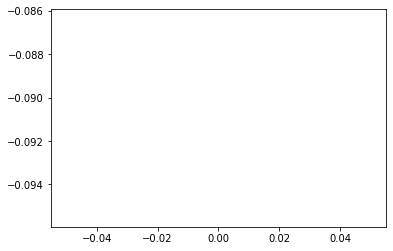

In [41]:
std4 = []
mean4 = []

for layer in layer4:
  if(len(layer.shape) == 2):
    std4.append(np.std(layer))
    print(np.std(layer))
    plt.imshow(layer)
    plt.show()
  else:
    mean4.append(np.mean(layer))
    print(np.mean(layer))
    plt.plot(layer)
    plt.show()